## Assignment 2: Time Series Forecasting

### \<Ngoc Phuong Quynh Nguyen></Ngoc>\<a1865083>

#### Follow detail instructions in the assignment specification and use these heading for implementation and discussion

### 1. Read the dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.arima_model import ARIMA
import datetime as dt
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM

In [2]:
energydata = pd.read_csv('energydata_complete.csv')

In [3]:
energydata.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [4]:
#Checking shape of dataset
energydata.shape

(19735, 29)

In [5]:
#Checking info of dataset
energydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [6]:
energydata.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [7]:
#reading variables description

f = open("variables_description.txt", "r")
print(f.read())

Variable Description

date time year-month-day hour:minute:second 
Appliances, energy use in Wh
lights, energy use of light fixtures in the house in Wh
T1, Temperature in kitchen area, in Celsius
RH_1, Humidity in kitchen area, in %
T2, Temperature in living room area, in Celsius
RH_2, Humidity in living room area, in %
T3, Temperature in laundry room area, in Celsius
RH_3, Humidity in laundry room area, in %
T4, Temperature in office room, in Celsius
RH_4, Humidity in office room, in %
T5, Temperature in bathroom, in Celsius
RH_5, Humidity in bathroom, in %
T6, Temperature outside the building (north side), in Celsius
RH_6, Humidity outside the building (north side), in %
T7, Temperature in ironing room , in Celsius
RH_7, Humidity in ironing room, in %
T8, Temperature in teenager room 2, in Celsius
RH_8, Humidity in teenager room 2, in %
T9, Temperature in parents room, in Celsius
RH_9, Humidity in parents room, in %
To, Temperature outside (from Chièvres weather station), in Celsius


RENAME COLUMNS FOR EASILY READING DATA

In [8]:
energydata = energydata.rename(columns={'T1': 'Temperature_Kitchen', 'RH_1': 'Humidity_Kitchen', 'T2': 'Temperature_Living', 'RH_2': 'Humidity_Living', 'T3': 'Temperature_Laundry', 'RH_3': 'Humidity_Laundry', 'T4': 'Temperature_Office', 'RH_4': 'Humidity_Office', 'T5': 'Temperature_Bathroom', 'RH_5': 'Humidity_Bathroom', 'T6': 'Temperature_Northside_Outside_Building', 'RH_6': 'Humidity_Northside_Outside_Building', 'T7': 'Temperature_Ironing', 'RH_7': 'Humidity_Ironing', 'T8': 'Temperature_Teenager_room2', 'RH_8': 'Humidity_Teenager_room2', 'T9': 'Temperature_Parents', 'RH_9': 'Humidity_Parents', 
                                        'T_out': 'Temperature_Outside', 'Press_mm_hg': 'Pressure', 'RH_out': 'Humidity_Outside', 'rv1': 'Random_var1', 'rv2': 'Random_var2'})

In [9]:
energydata.head()

,date,Appliances,lights,Temperature_Kitchen,Humidity_Kitchen,Temperature_Living,Humidity_Living,Temperature_Laundry,Humidity_Laundry,Temperature_Office,...,Temperature_Parents,Humidity_Parents,Temperature_Outside,Pressure,Humidity_Outside,Windspeed,Visibility,Tdewpoint,Random_var1,Random_var2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


### 2. Analyse and visualise the data

2.1 Exploratory Data Analysis (EDA) and Data Preparation

In [10]:
#checking percentage of null values in each column
df_missing=pd.DataFrame((round(100*(energydata.isnull().sum()/len(energydata.index)), 2)), columns=['missing'])
df_missing.sort_values(by=['missing'], ascending=False).head(20)

,missing
date,0.0
Temperature_Ironing,0.0
Random_var1,0.0
Tdewpoint,0.0
Visibility,0.0
Windspeed,0.0
Humidity_Outside,0.0
Pressure,0.0
Temperature_Outside,0.0
Humidity_Parents,0.0


2.2 Finding Categorical and Numerical Values

2.2.1 Categorical Values

In [11]:
categorical = [var for var in energydata.columns if energydata[var].dtype=='O']

print('There is {} categorical variable\n'.format(len(categorical)))

print('The categorical variable is :\n\n', categorical)

There is 1 categorical variable

The categorical variable is :

 ['date']


In [12]:
# Converting the 'date' column to datetime
energydata['date'] = pd.to_datetime(energydata['date'])

In [13]:
# Extracting date and time components
energydata['year'] = energydata['date'].dt.year
energydata['month'] = energydata['date'].dt.month
energydata['day'] = energydata['date'].dt.day
energydata['hour'] = energydata['date'].dt.hour
energydata['weekday'] = energydata['date'].dt.weekday

# Determine if the day is a weekend
energydata['weekend'] = energydata['weekday'].apply(lambda x: 1 if x >= 5 else 0)

energydata['weekend'] = np.where(energydata['weekday'] >= 5, 1, 0)

2.2.2 Numerical Values

In [14]:
numeric_data = energydata.select_dtypes(include = ['float64','int64'])

print('There are {} numerical variables\n'.format(len(numeric_data)))

print('The numerical variables are :\n\n', numeric_data)

There are 19735 numerical variables

The numerical variables are :

        Appliances  lights  Temperature_Kitchen  Humidity_Kitchen  \
0              60      30            19.890000         47.596667   
1              60      30            19.890000         46.693333   
2              50      30            19.890000         46.300000   
3              50      40            19.890000         46.066667   
4              60      40            19.890000         46.333333   
...           ...     ...                  ...               ...   
19730         100       0            25.566667         46.560000   
19731          90       0            25.500000         46.500000   
19732         270      10            25.500000         46.596667   
19733         420      10            25.500000         46.990000   
19734         430      10            25.500000         46.600000   

       Temperature_Living  Humidity_Living  Temperature_Laundry  \
0               19.200000        44.790000     

In [15]:
numeric_data.head()

,Appliances,lights,Temperature_Kitchen,Humidity_Kitchen,Temperature_Living,Humidity_Living,Temperature_Laundry,Humidity_Laundry,Temperature_Office,Humidity_Office,...,Temperature_Parents,Humidity_Parents,Temperature_Outside,Pressure,Humidity_Outside,Windspeed,Visibility,Tdewpoint,Random_var1,Random_var2
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [16]:
numeric_data.columns

Index(['Appliances', 'lights', 'Temperature_Kitchen', 'Humidity_Kitchen',
       'Temperature_Living', 'Humidity_Living', 'Temperature_Laundry',
       'Humidity_Laundry', 'Temperature_Office', 'Humidity_Office',
       'Temperature_Bathroom', 'Humidity_Bathroom',
       'Temperature_Northside_Outside_Building',
       'Humidity_Northside_Outside_Building', 'Temperature_Ironing',
       'Humidity_Ironing', 'Temperature_Teenager_room2',
       'Humidity_Teenager_room2', 'Temperature_Parents', 'Humidity_Parents',
       'Temperature_Outside', 'Pressure', 'Humidity_Outside', 'Windspeed',
       'Visibility', 'Tdewpoint', 'Random_var1', 'Random_var2'],
      dtype='object')

Examining the effects temperature and humidity on energy use in both appliances and lights.
- Appliances typically have a broader range of power consumption than lights, varying from small kitchen appliances to larger systems like HEATING. VENTILATION, AIR CONDITIONING. Hence, the energy consumption of appliances might directly correlate with temperature and humidity due to their use in climate control (heaters, air conditioners) or influence by indoor climate (refrigerators, ovens).
- Since appliances can be major energy consumers, understanding their usage patterns in relation to environmental variables like temperature and humidity could yield significant insights for energy efficiency improvements.
- Whereas, lights tend to have a more consistent usage pattern, though usage can still vary based on daylight availability, which correlates with times of day and possibly seasons. While the correlation between lighting use and environmental factors like temperature and humidity may be less direct, it could provide insights into occupancy patterns and behavioral aspects of energy use.

Hence, I will use displots, scatter plots, histograms, box charts, correlation matrices, and basic regression models to see how strongly temperature and humidity are related to energy use in appliances and how strongly relationship of lights and times of day. 
Besides that, I will use the day time data including Hours of Day and Days of Month to see how strongly effects of temperature and humidity on energy use in both appliances and lights as the fluctuation in temperature and humidity can be more varied during hours of day and days of month rather than months of year and years

i. Displots

a. Kitchen area

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\855750751.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Kitchen'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


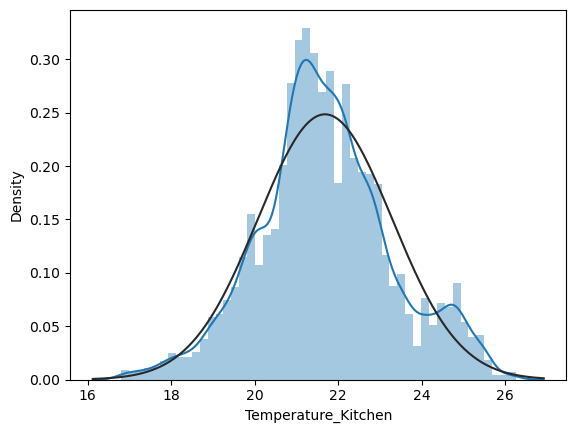

In [17]:
# Visualize the spread of Target Variable 'Temperature in kitchen area'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Kitchen'], fit=norm)
plt.show()

Observations:
- The x-axis shows that the temperatures recorded range from approximately 16 degrees to 26 degrees. The data is concentrated in the middle of the range, with fewer instances towards the ends of the range.
- The bars represent the frequency of temperature measurements within specific intervals. The tallest bars are centered around 20-22 degrees, suggesting that most of the temperature readings fall within this range.
- The smooth curve overlaid on the histogram is likely a kernel density estimation (KDE), which provides a smooth representation of the data distribution. The peak of this curve corresponds with the tallest bar, reinforcing the concentration of values in the 20-22 degrees range.
- The distribution looks fairly symmetrical around its central peak. There doesn't appear to be significant skewness in either direction, which suggests the temperature readings are fairly normally distributed around the mode.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3846000942.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Kitchen'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


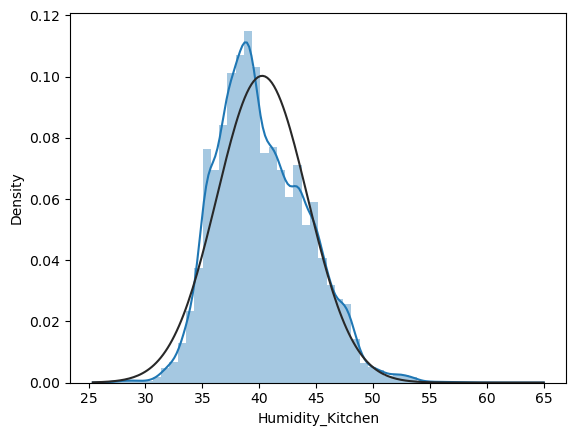

In [18]:
# Visualize the spread of Target Variable 'Humidity in kitchen area'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Kitchen'], fit=norm)
plt.show()

Observations:
- The measurements range from about 30% to just over 60% humidity. The density of observations is highest in the middle of this range, particularly around the 40-45% mark.
- Each bar corresponds to a range of humidity values and its height reflects the density of observations within that range. The distribution of bars indicates how the humidity measurements are spread across different values.
- The smooth line overlaying the histogram is likely a kernel density estimation (KDE), a method used to estimate the probability density function of a continuous variable. The peak of this line suggests the mode of the distribution.
- The distribution has a prominent peak around 40-45% humidity and tapers off towards the tails. It appears slightly skewed to the right, indicating that there are more observations with higher humidity than what would be expected in a perfectly symmetrical distribution.
- The tail on the right side of the distribution, beyond the peak, is longer and has more density than the tail on the left. This suggests positive skewness, where a subset of measurements has higher humidity levels compared to the rest of the data.
- There seems to be a slight indication of a secondary, smaller peak around 55% humidity, suggesting a potential bimodality. This could indicate two different common conditions within the dataset, perhaps related to specific times of the day or different weather conditions


b. Living room area

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3382196207.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Living'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


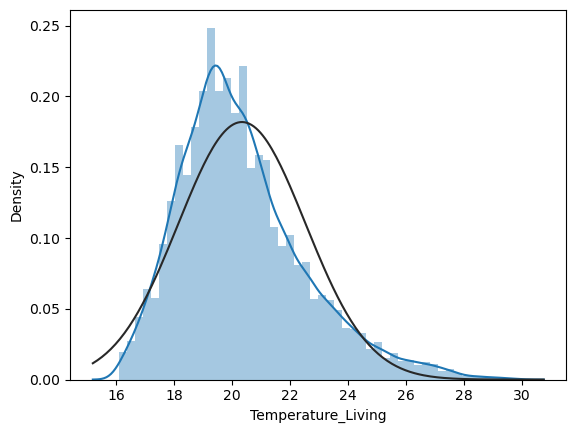

In [19]:
# Visualize the spread of Target Variable 'Temperature in living room area'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Living'], fit=norm)
plt.show()

Observations:
- The values range from approximately 16°C to around 30°C, suggesting that these are the observed temperatures in the living room over a certain period.
- The distribution appears approximately normal (bell-shaped), centered around 22°C to 24°C, which suggests that these temperatures are the most frequently recorded in the living room.
- The distribution has a slight right skewness, as indicated by a tail that extends further to the right. There's a noticeable secondary peak around 18°C to 20°C, possibly indicating a bimodal distribution where two different temperature conditions commonly occur.
- The temperatures tail off below 18°C and above 26°C, which are less common in this setting.
- The main peak of the distribution indicates the most comfortable or typical temperature range for the living room, possibly reflecting an ideal setting for heating or air conditioning systems.
- Overall, this histogram suggests that the living room temperatures are typically stable, with a clear preference around 22°C to 24°C, but with notable occurrences of cooler conditions around 18°C to 20°C. This could be useful for setting climate control systems efficiently or investigating factors that cause the variability in room temperature.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1509960720.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Living'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


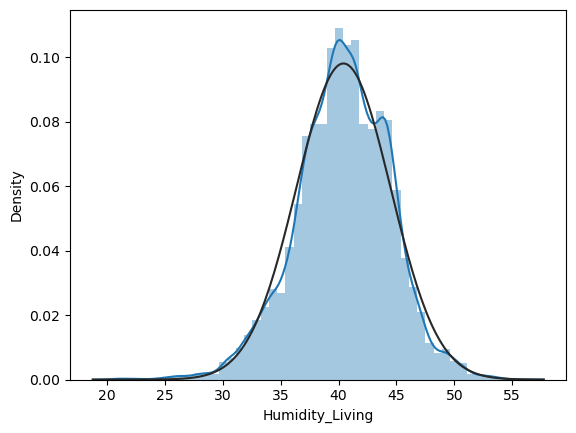

In [20]:
# Visualize the spread of Target Variable 'Humidity in living room area'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Living'], fit=norm)
plt.show()

Observations:
- The range of humidity levels shown is from about 20% to just above 55%. This indicates that the data includes various humidity conditions typically experienced indoors.
- It provides a continuous probability density curve of the humidity data. The distribution is approximately normal but shows a slight right skew, indicating that there are more frequent higher humidity readings than what a perfectly symmetrical distribution would suggest.
- The distribution peaks around 40% to 45% humidity, suggesting this is the most common indoor humidity level in the living room.
- The spread of the distribution from about 30% to 50% indicates variability in indoor humidity, which could be influenced by factors such as weather conditions, indoor heating or cooling systems, and ventilation.
- There is a small secondary peak around 30% humidity, suggesting that lower humidity conditions also occur frequently, though less so than the central peak around 40% to 45%.
- This histogram is valuable for understanding indoor climate control needs, particularly in managing air quality and comfort. It suggests that while the living room typically maintains a moderate humidity level, there are significant fluctuations that might require attention for optimal comfort and health.

c. Laundry room area

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3170699704.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Laundry'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


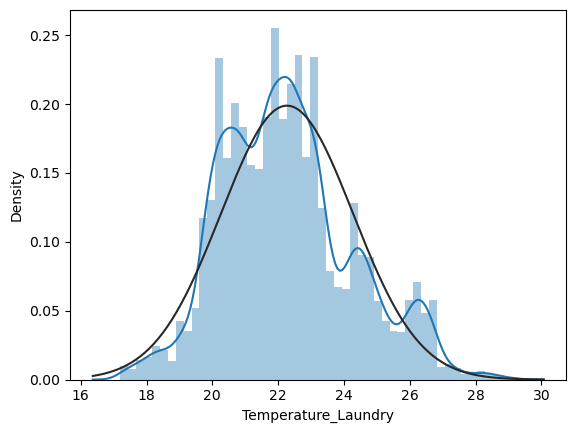

In [21]:
# Visualize the spread of Target Variable 'Temperature in laundry room area'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Laundry'], fit=norm)
plt.show()

Observations:
- This histogram plot illustrates the distribution of temperature readings (in degrees Celsius) in a laundry room, as indicated by the x-axis label "Temperature_Laundry". Below are several key aspects of the plot and what they represent:
- The range of temperature levels shown is from approximately 16°C to 30°C. This range is typical for indoor environments, depending on heating or cooling controls and external weather conditions.
- The bars represent the frequency of temperature readings within specific intervals. The taller bars indicate a higher concentration of data points within those temperature ranges.
- The distribution appears to be bimodal, with two distinct peaks around 20°C and 24°C. This suggests there are two common temperature conditions in the laundry room, possibly reflecting different modes of operation or times of the day.
Analysis of Peaks: The peak near 24°C is the highest, indicating it is the most frequently observed temperature range in the laundry room. The secondary peak near 20°C suggests that this lower temperature also commonly occurs.
- There is a long right tail extending towards 30°C, suggesting that higher temperatures, though less frequent, are still significantly present.
- This histogram is useful for understanding the thermal conditions within the laundry room, showing variability and common conditions. The dual peaks might indicate changes in the usage of the room or effects of external weather conditions impacting indoor temperatures. This analysis could inform decisions about heating, cooling, and ventilation for maintaining comfortable and consistent indoor environments.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1522432563.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Laundry'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


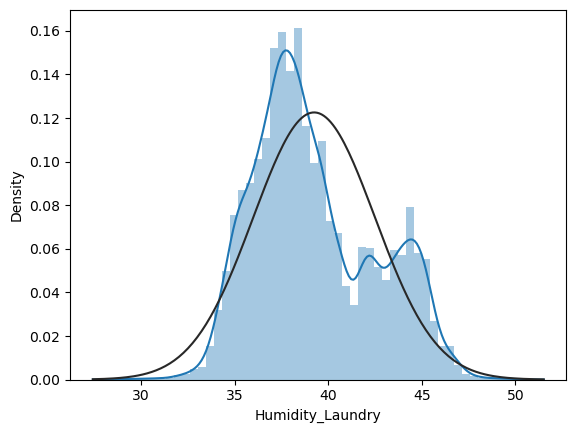

In [22]:
# Visualize the spread of Target Variable 'Humidity in laundry room area'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Laundry'], fit=norm)
plt.show()

Observations:
- This x-axis shows the range of humidity levels, spanning from approximately 30% to 50%. This range reflects typical moisture levels in a space where laundry activities occur, influenced by factors like drying processes and ambient conditions.
- This provides a smoothed, continuous approximation of the histogram, helping to identify the overall pattern and distribution of the humidity data.
Shape of the Distribution: The distribution is notably bimodal, with two distinct peaks, suggesting two prevalent humidity conditions in the laundry room. This could be related to different phases of laundry activities (e.g., washing vs. drying) or variations in external weather conditions.
- The first peak around 35% and a higher peak near 43% indicate these are common humidity conditions. The taller peak suggests that the laundry room frequently experiences humidity levels around 43%.
- Understanding these humidity patterns is crucial for managing indoor air quality and preventing issues like mold growth. The bimodal nature of the distribution might indicate the need for adaptive ventilation or dehumidification strategies based on activity levels or external conditions.
- This detailed analysis of the histogram helps in assessing the environmental conditions within the laundry room, which is essential for optimizing comfort and operational efficiency.

d. Office room area

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1033921155.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Office'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


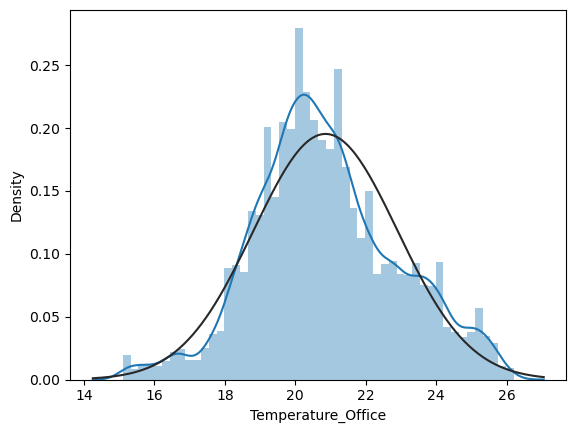

In [23]:
# Visualize the spread of Target Variable 'Temperature in office room area'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Office'], fit=norm)
plt.show()

Observations:
- The range of temperature shown is from approximately 14°C to 26°C. This range is typical for indoor office settings, influenced by heating, cooling, and the building's insulation.
- The distribution appears to be bimodal, with two peaks suggesting two predominant temperature settings in the office. This might indicate different preferred settings or fluctuations due to external weather changes or variations in heating and cooling throughout the day.
- The main peak near 20°C represents the most common temperature, suggesting that this is a typical set point for climate control in the office. A smaller peak around 24°C indicates another frequent temperature range, possibly during times when less climate control is active (e.g., during off-hours or transitional seasons).
- The distribution tails off below 16°C and above 24°C, indicating these temperatures are less commonly experienced in the office environment.
- This histogram is crucial for understanding the thermal environment in the office, showing the variability and common conditions. Insight into these temperature distributions can help facilities managers optimize climate control settings to improve comfort and energy efficiency.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1309109340.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Office'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


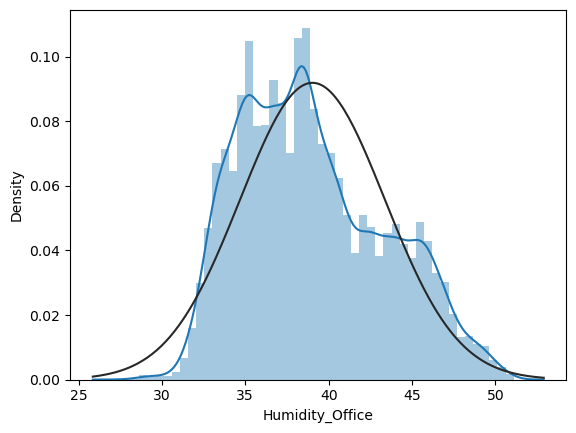

In [24]:
# Visualize the spread of Target Variable 'Humidity in office room area'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Office'], fit=norm)
plt.show()

Observations:
- This axis displays the range of humidity levels, spanning from approximately 25% to 50%. These levels are typical for indoor environments, affected by factors such as air conditioning, heating, and ventilation systems.
- The distribution appears to be bimodal, with two peaks around 35% and 40%. This suggests that there are two common states of humidity in the office, which could be related to different ventilation or air conditioning settings, or possibly varying occupancy levels throughout the day.
- The peak near 35% is lower, indicating it is a common but less dominant condition, while the peak near 40% is more pronounced, suggesting it is the more typical humidity condition in the office. This could imply preferred settings or more frequent conditions based on the building's HVAC system performance.
- The distribution shows a decline after 45%, indicating that higher humidity levels are less commonly experienced in the office environment.
- This histogram is useful for understanding the moisture conditions within an office, which can have implications for comfort and health. The dual peaks might also suggest varying conditions that could impact employee comfort or the efficiency of office equipment. Such insights can be vital for facilities management in optimizing the office environment for both comfort and energy usage.








e. Bathroom

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\2724554080.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Bathroom'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


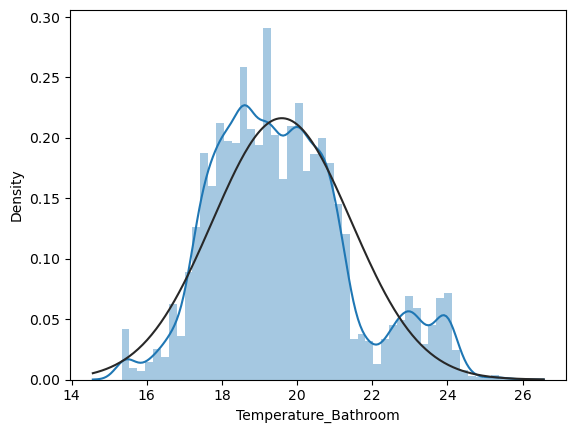

In [25]:
# Visualize the spread of Target Variable 'Temperature in bathroom'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Bathroom'], fit=norm)
plt.show()

Observations:
- This axis shows the range of temperature readings from approximately 14°C to 26°C. These temperatures are common for bathrooms, which may vary due to factors like heating, ventilation, and the use of hot water.
- The distribution appears to be bimodal, with two prominent peaks around 18°C and 22°C. This suggests two prevalent temperature settings or conditions in the bathroom, potentially corresponding to different times of the day or different uses (e.g., morning showers vs. evening baths).
- The peak at 22°C is higher, indicating it is a more frequent condition, likely corresponding to warmer periods when hot water usage increases the ambient temperature. The peak at 18°C suggests a cooler state, possibly occurring during periods of non-use or when less hot water is used.
- The distribution extends towards cooler and warmer extremes, showing a spread in the temperatures experienced in the bathroom, but with less frequency compared to the central peaks.
- Understanding the distribution of temperatures in a bathroom is useful for managing comfort and energy efficiency. Identifying common temperature conditions can guide the adjustment of heating and ventilation systems to improve comfort and reduce energy consumption in residential or commercial buildings.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\2373281248.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Bathroom'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


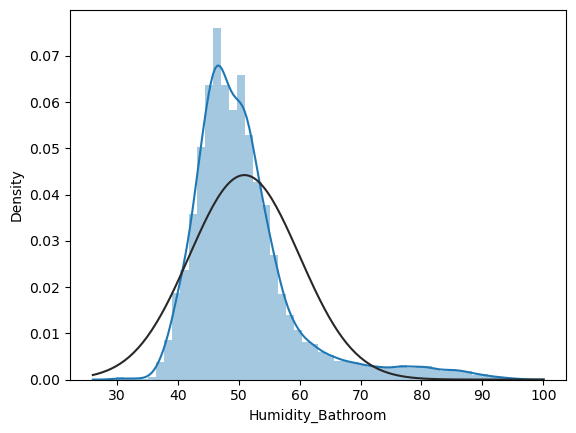

In [26]:
# Visualize the spread of Target Variable 'Humidity in bathroom'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Bathroom'], fit=norm)
plt.show()

Observations:
- The x-axis represents the range of humidity levels, extending from 30% to 100%. These levels are typical for bathrooms, which can vary widely due to the presence of steam from showers and baths.
- The distribution shows a clear peak around 50%, indicating a common average humidity level in the bathroom. There's also a less pronounced peak near 70%, suggesting secondary common conditions, likely associated with periods of high steam production.
- The primary peak at 50% suggests a typical ambient humidity in the bathroom under normal conditions. The secondary peak at 70% is likely a reflection of increased humidity during and after activities like taking hot showers or baths.
- There is a significant tail stretching towards higher humidity levels, peaking again near 100%, which could indicate conditions immediately after heavy steam production when the room is fully saturated with moisture.
- Understanding these humidity patterns is crucial for assessing the ventilation needs in a bathroom. Effective ventilation helps in managing moisture levels, preventing mold growth, and ensuring a comfortable environment. This analysis could be used to recommend improvements in bathroom fan use or the installation of more efficient ventilation systems to maintain optimal humidity levels.

f. Northside_Outside_Building

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1641520377.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Northside_Outside_Building'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


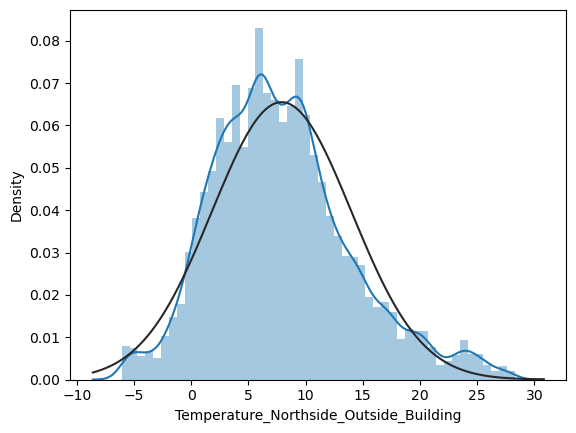

In [27]:
# Visualize the spread of Target Variable 'Temperature outside the building (North side)'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Northside_Outside_Building'], fit=norm)
plt.show()

Observations:
- This axis shows the temperature range, spanning from about -10°C to 30°C. This range reflects the variability in temperatures that the north side of a building might experience, likely influenced by seasonal changes and the building's exposure to sunlight.
- The distribution appears to be roughly unimodal but slightly skewed to the right, with a peak around 10°C. This suggests that the most common temperatures on the north side of the building are relatively cool, which is typical for areas receiving less direct sunlight.
- The highest peak occurs near 10°C, indicating this is the most frequently observed temperature. There are smaller peaks around 0°C and just below 20°C, suggesting these temperatures also occur with some regularity, possibly during transitional seasons like spring and fall.
- The distribution has a long tail extending toward higher temperatures, peaking again around 25°C, which could indicate occasional warm days, perhaps influenced by unusual weather conditions or reflections from other surfaces.
- Understanding the temperature distribution on the north side of a building is crucial for effective building management, particularly in terms of heating needs and energy efficiency. This data can inform decisions about insulation, heating systems, and window treatments to optimize indoor comfort and reduce energy consumption throughout the year.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\237839656.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Northside_Outside_Building'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


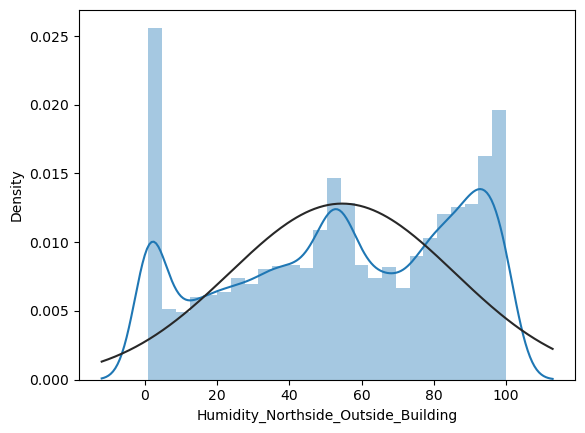

In [28]:
# Visualize the spread of Target Variable 'Humidity outside the building (North side)'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Northside_Outside_Building'], fit=norm)
plt.show()

Observations: 
- This axis displays the range of humidity levels, from 0% to 100%. These levels are typical for measuring atmospheric humidity, which can vary widely depending on weather conditions and building exposure.
- The distribution is complex, showing multiple peaks, which suggests a multimodal distribution of humidity levels. The peaks around 20%, 60%, and above 90% indicate various common conditions that could correspond to different weather patterns or specific responses of the building environment to external conditions.
- Analysis of Peaks:
    + Peak around 20%: This suggests that there are times when the humidity is relatively low, which might occur during colder months or dry conditions.
    + Peak around 60%: This level of humidity is more typical and could represent an average condition that frequently occurs.
    + High peaks above 90%: These suggest periods of very high humidity, likely associated with rainy weather or specific events like fogging.
- The distribution shows a significant presence of very high humidity readings, which extends towards the upper limit of 100%, indicating that conditions on the north side of the building can occasionally become extremely humid.
- Understanding the distribution of humidity on the north side of a building can be crucial for managing indoor air quality and structural integrity, especially in controlling moisture-sensitive areas and preventing mold growth. This data can help in designing HVAC systems and choosing appropriate materials for construction and renovation projects to withstand varying humidity conditions.

g. Ironing room

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3035556334.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Ironing'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


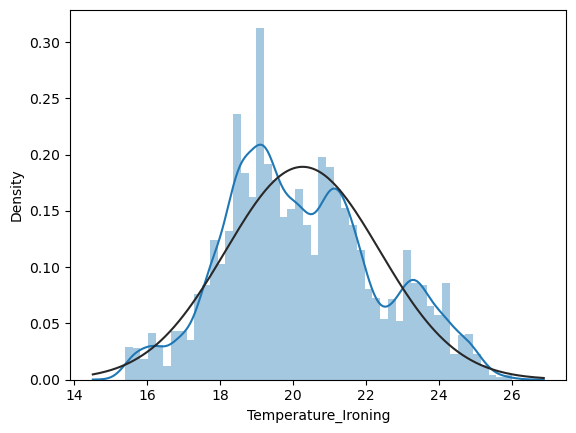

In [29]:
# Visualize the spread of Target Variable 'Temperature in ironing room'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Ironing'], fit=norm)
plt.show()

Observations:
- The x-axis represents the range of temperature readings, from approximately 14°C to 26°C. These temperatures are typical for an area where ironing occurs, potentially influenced by the heat from ironing equipment.
- The distribution is slightly skewed to the right and appears to be bimodal, with two peaks around 18°C and 22°C. This suggests two predominant temperature conditions in the ironing area, which could be related to times when ironing equipment is actively used versus when it is off.
- Analysis of Peaks:
    + Peak at 18°C: Represents a common but cooler temperature, possibly during times when no ironing is taking place or just after the equipment has been turned off.
    + Peak at 22°C: Indicates a higher frequency at a warmer temperature, likely when ironing equipment is in use and affecting the ambient temperature.
- There's a noticeable decrease in frequency as temperatures move towards 26°C, showing that very high temperatures are less common in the area, perhaps due to the effectiveness of ventilation or room size.
- This histogram is useful for understanding the thermal dynamics in an ironing area, providing insights into how temperature is affected by ironing activities and potentially guiding decisions on climate control or workflow scheduling to enhance comfort and safety.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1099479083.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Ironing'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


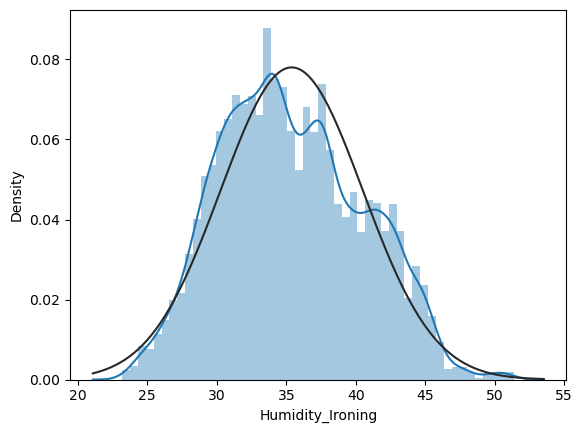

In [30]:
# Visualize the spread of Target Variable 'Humidity in ironing room'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Ironing'], fit=norm)
plt.show()

Observations:
- The x-axis displays the range of humidity levels, spanning from about 20% to 55%. These levels indicate the moisture content in the air within the ironing area, which can vary due to the steam generated by ironing.
- The distribution is unimodal with a clear peak around 35%, indicating a predominant humidity condition in the ironing area. This peak likely represents the most common atmospheric condition affected by the regular use of steam irons.
- Analysis of Peaks:
    + Primary Peak at 35%: This peak suggests that a typical humidity level during ironing activities is around 35%, which might be influenced by the constant use of steam.
- There's a gradual decrease in frequency as humidity levels move towards both the lower and higher ends of the spectrum, indicating less frequent extremes in humidity.
- The distribution shows tails extending towards both lower and higher humidity levels, but these are significantly less common than the central peak. The lower tail towards 20% and the higher tail past 45% reflect conditions when there is less steam generation or perhaps when the area is not in active use.
- Understanding the humidity distribution in an ironing area is essential for managing indoor air quality and ensuring comfort. High humidity can affect comfort levels and may also influence the longevity of ironing equipment and textiles. The insights from this histogram could guide decisions on ventilation and humidity control to maintain an optimal environment for ironing activities.

h. Teenager room 2

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1287017475.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Teenager_room2'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


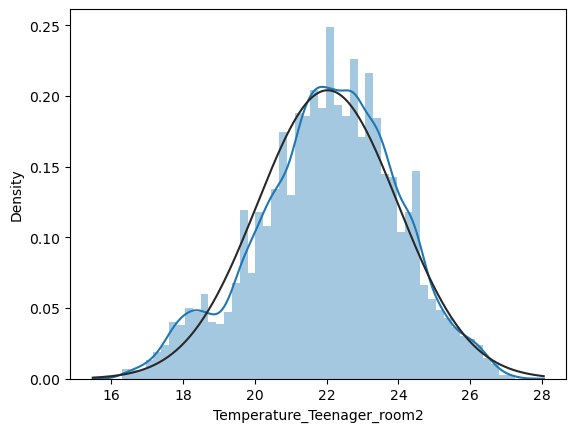

In [31]:
# Visualize the spread of Target Variable 'Temperature in teenager room 2'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Teenager_room2'], fit=norm)
plt.show()

Observations:
- The x-axis displays the range of temperature readings, from about 16°C to 28°C. This range is typical for indoor room environments, reflecting various conditions such as seasonal changes, heating, or cooling.
- The distribution appears to be unimodal with a clear peak around 22°C, indicating the most common temperature in the room. The shape is slightly skewed to the right, suggesting a tail of higher temperatures that occur less frequently.
- Analysis of Peaks:
    + Main Peak at 22°C: This peak shows that 22°C is a typical and comfortable temperature for the room, likely reflecting a preferred setting on heating or cooling devices.
- The tail extending towards 28°C could reflect periods when the room gets warmer, possibly during the day if exposed to sunlight or when electronic devices are used extensively.
- There are notable variations in the histogram bars at higher temperatures (24°C to 26°C), which might be indicative of less consistent conditions, perhaps influenced by specific activities in the room or changes in external weather.
- This histogram is useful for understanding the thermal comfort in a teenager's room, which can help in managing energy use effectively and ensuring comfort. Monitoring and analyzing such data can provide insights for making adjustments to heating or cooling patterns, potentially leading to more efficient energy usage and enhanced comfort.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\350174244.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Teenager_room2'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


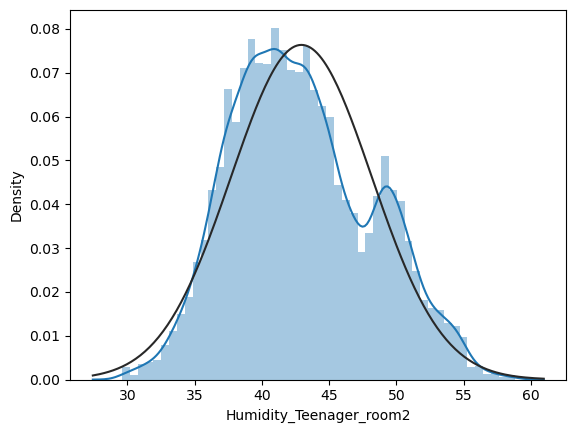

In [32]:
# Visualize the spread of Target Variable 'Humidity in teenager room 2'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Teenager_room2'], fit=norm)
plt.show()

Observations:
- The axis ranges from 30% to 60%, representing the humidity levels in the room. This range is typical for indoor environments, where humidity can fluctuate due to factors like ventilation, room occupancy, and external weather conditions.
- The distribution is unimodal and slightly skewed to the right, with a prominent peak around 45%. This suggests that the most common humidity level in the room is around 45%, indicating a relatively comfortable humidity setting for typical indoor environments.
- Analysis of Peaks:
    + Main Peak at 45%: This central peak indicates that a humidity level around 45% is typically maintained in the room, likely due to natural conditions or the use of humidifiers or dehumidifiers.
- There is a tail extending towards higher humidity levels, peaking again around 55%, which could represent conditions when the room is less ventilated or during specific activities that increase moisture, such as showering or drying clothes indoors.
- Understanding the humidity distribution in a teenager's room is important for ensuring comfort and health. High humidity levels can lead to mold growth and allergen proliferation, while too low humidity might cause respiratory discomfort or skin irritation. Insights from this histogram can guide decisions on improving ventilation or using humidity control devices to maintain an optimal environment.

i. Parents room

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\78183749.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Parents'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


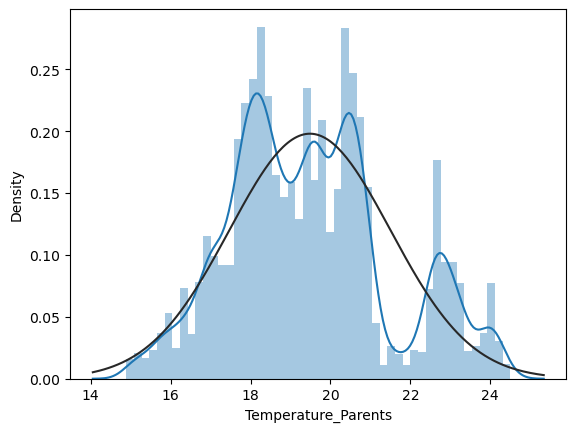

In [33]:
# Visualize the spread of Target Variable 'Temperature in parents room'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Parents'], fit=norm)
plt.show()

Observations:
- This axis shows the range of temperature readings, spanning from approximately 14°C to 24°C. This temperature range is typical for indoor environments, reflecting variations due to heating, cooling, and natural fluctuations in room temperature.
- The distribution appears to be multimodal, with several peaks suggesting that there are multiple preferred temperature settings or conditions in the room. Peaks around 18°C, 20°C, and 22°C indicate these temperatures are commonly experienced in the room.
- Analysis of Peaks:
    + Peak at 18°C: Represents a common cooler temperature, possibly during night times or cooler months.
    + Peak at 20°C and 22°C: These peaks suggest warmer conditions that might be preferred during daytime or in colder months when heating is likely used.
- The distribution tails off towards the higher temperatures, around 24°C, indicating that higher temperatures, while present, are less common.
- This histogram is useful for understanding the thermal conditions in a parents' room, which can aid in optimizing climate control settings for comfort and energy efficiency. The multiple peaks might indicate the use of heating or air conditioning at different times to maintain different comfort levels or could reflect seasonal changes in the external temperature affecting the room's climate.

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\360931950.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Parents'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


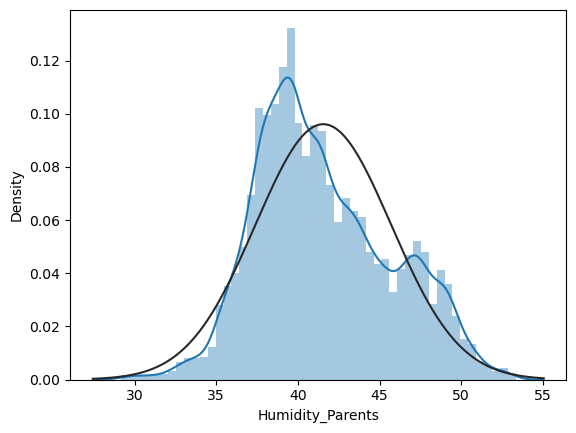

In [34]:
# Visualize the spread of Target Variable 'Humidity in parents room'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Parents'], fit=norm)
plt.show()

Observations:
- This axis displays the range of humidity levels, spanning from about 30% to 55%. These levels are typical for indoor environments, which can vary due to factors like ventilation, heating, or natural air moisture.
- The distribution is unimodal with a clear peak around 40%. This suggests that the most common humidity level in the room is around 40%, indicating a relatively stable and comfortable indoor environment.
- Analysis of Peaks:
    + Primary Peak at 40%: This peak suggests that the typical humidity level during most conditions is around 40%, which is considered comfortable for most indoor settings. It might reflect the influence of heating or cooling systems equipped with humidity control.
- There is a tail extending towards higher humidity levels, indicating that there are periods when the humidity rises above the normal range, possibly due to external weather conditions, lack of ventilation, or specific activities that increase indoor moisture.
- Understanding the humidity distribution in a parents' room is essential for ensuring comfort and health. High humidity can encourage mold growth and allergens, while too low humidity might cause respiratory discomfort or skin irritation. Insights from this histogram can guide decisions on improving ventilation or using humidity control devices to maintain an optimal and healthy indoor environment.

j. Outside (from Chièvres weather station)

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\2349720887.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Temperature_Outside'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


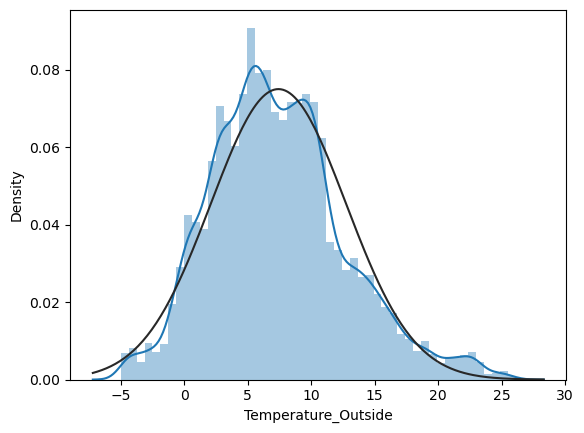

In [35]:
# Visualize the spread of Target Variable 'Temperature outside (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Temperature_Outside'], fit=norm)
plt.show()

Observations:
- The x-axis ranges from -5°C to 30°C, encompassing the typical temperature variations one might expect outdoors in many climates. This range includes below-freezing temperatures, moderate temperatures, and warmer conditions, reflecting seasonal changes.
- The distribution appears to be roughly unimodal with a slight skew towards lower temperatures, featuring a prominent peak around 10°C. This suggests that the most common outside temperature in this data set is near 10°C.
- Analysis of Peaks:
    + Primary Peak at 10°C: This peak indicates the most frequently observed temperature, likely representative of a typical weather condition for the location during the period measured.
- There's a noticeable spread toward lower temperatures, dipping below freezing, and a tail extending towards warmer temperatures, reaching up to 30°C. These tails suggest that while the most common temperatures are cool, there are significant occurrences of both colder and warmer weather.
- Understanding this temperature distribution is crucial for various applications, including climate study, weather prediction, and in planning for energy needs. It can help in assessing the typical weather patterns of a region, guiding clothing choices, heating and cooling needs, and even agricultural practices.







C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3806084979.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Humidity_Outside'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


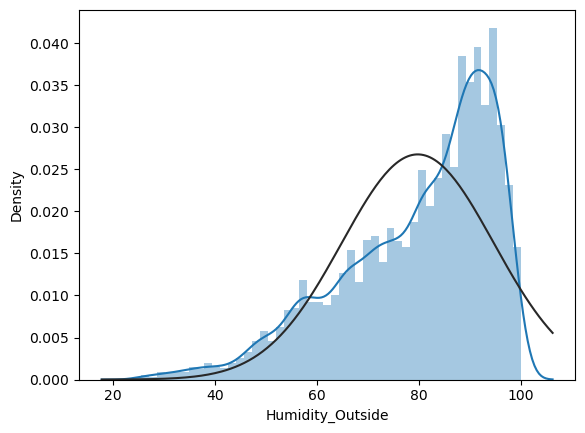

In [36]:
# Visualize the spread of Target Variable 'Humidity outside (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Humidity_Outside'], fit=norm)
plt.show()

Observations:
- The x-axis represents the range of humidity levels, from 20% to 100%. This wide range encompasses varying outdoor humidity conditions, from dry to fully saturated air.
- The distribution appears to be bimodal, with two significant peaks around 60% and near 100%. This suggests that there are two prevalent sets of conditions:
    + Peak around 60%: Indicates a common humidity level that likely represents typical weather conditions.
    + Peak near 100%: Suggests frequent occurrences of very high humidity, possibly during rainy or foggy conditions.
- The distribution extends towards lower humidity levels with less frequency, indicating that extremely dry conditions are less common. The tail off towards lower humidity past the 60% peak shows a decline in frequency as the humidity decreases.
- Understanding the distribution of outside humidity is crucial for several applications, including weather forecasting, climate studies, and agricultural planning. High humidity can affect everything from human comfort and building structures to the growth of crops and the prevalence of pests and diseases. This histogram is useful for grasifying the variability and typical conditions of outdoor humidity, which can inform decisions related to weather preparedness and environmental management.







k. Pressure (from Chièvres weather station)

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1203101871.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Pressure'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


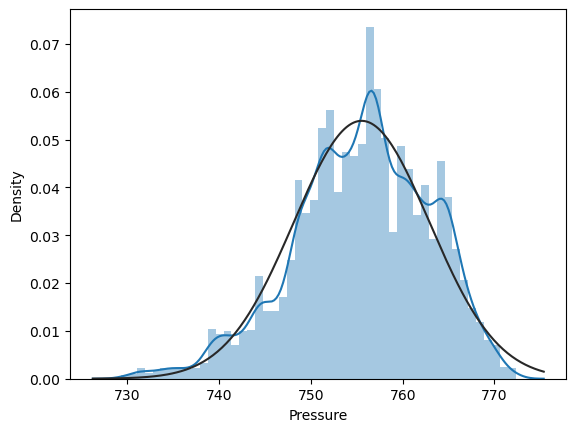

In [37]:
# Visualize the spread of Target Variable 'Pressure (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Pressure'], fit=norm)
plt.show()

Observations:
- The x-axis displays atmospheric pressure ranging from 730 millibars to 770 millibars. This range covers typical variations in atmospheric pressure that one might observe in weather conditions.
- he distribution appears to be unimodal with a slight skew towards higher pressure readings, featuring a prominent peak around 755 millibars. This suggests that the most common atmospheric pressure recorded in this dataset is near 755 millibars.
- Analysis of Peaks:
    + Primary Peak at 755 millibars: This peak represents the most frequently observed atmospheric pressure, likely indicative of the prevailing weather conditions during the period measured.
- There is a spread toward lower pressures, with fewer occurrences below 740 millibars, and a tail extending towards higher pressures, peaking again around 765 millibars. These tails suggest fluctuations in atmospheric pressure, possibly associated with different weather systems passing through the area.
- Understanding this distribution of atmospheric pressure is crucial for meteorological studies, weather forecasting, and climate research. It helps in assessing weather pattern stability and predicting changes, such as the arrival of storm systems or high-pressure weather conditions that might bring clear skies.

l. Windspeed (from Chièvres weather station)

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3841000021.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Windspeed'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


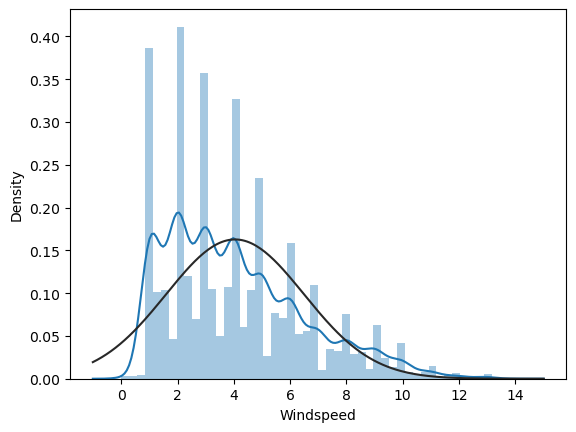

In [38]:
# Visualize the spread of Target Variable 'Windspeed (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Windspeed'], fit=norm)
plt.show()

Observations:
- This axis represents wind speed ranging from 0 to 14 meters per second. This scale covers calm to moderate wind conditions, typical for many regions.
- The distribution shows a significant right skew, indicating that lower wind speeds are much more frequent than higher wind speeds. There is a peak at lower wind speeds, particularly around 2 meters per second, suggesting that calm conditions are prevalent.
- Analysis of Peaks:
    + Main Peak around 2 meters per second: This peak suggests that the most common wind speed is relatively low, indicating light breezes are typical in the area being measured.
- The frequency of observations decreases as wind speed increases, which is typical for many locations where high wind speeds are less common than moderate or low speeds.
- The tail extends toward higher wind speeds, showing that while less common, there are still notable occurrences of wind speeds up to 14 meters per second. This tail is crucial for understanding the potential for gusty conditions that might impact structures, transport, and outdoor activities.
- This histogram is useful for meteorological analysis, providing insights into wind conditions that can help in weather forecasting, planning outdoor activities, and designing buildings and structures to withstand local wind speeds. It also aids in the assessment of potential for wind energy generation.

m. Visibility (from Chièvres weather station)

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\816876271.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Visibility'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


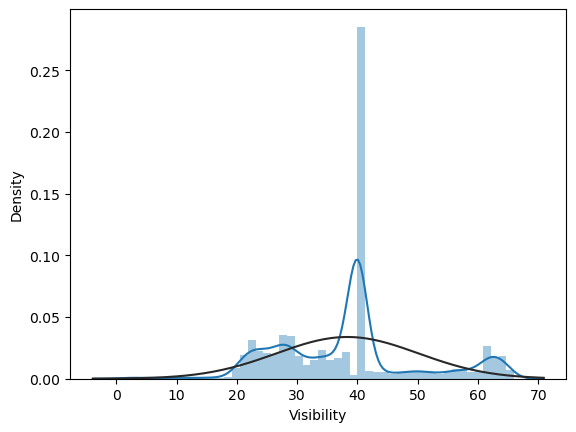

In [39]:
# Visualize the spread of Target Variable 'Visibility (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Visibility'], fit=norm)
plt.show()

Observations:
- This axis ranges from 0 to 70 kilometers, representing visibility distances. Visibility can vary widely due to weather conditions such as fog, rain, snow, or clear skies.
- The distribution shows a significant peak at around 50 kilometers, suggesting that high visibility distances are common. However, the distribution also shows smaller peaks and troughs at lower distances, indicating variability in visibility conditions.
- Analysis of Peaks:
    + Main Peak at 50 kilometers: This peak suggests that the most frequently observed visibility distance is around 50 kilometers, likely indicative of clear weather conditions.
- The presence of multiple smaller peaks at lower distances (around 10 and 30 kilometers) suggests that there are also frequent occurrences of reduced visibility, possibly due to weather phenomena like fog, mist, or heavy precipitation.
- The distribution tails off towards both the lower and higher ends of the visibility scale, with fewer occurrences of extremely low (near 0 kilometers) and very high (up to 70 kilometers) visibility. This tail towards lower visibility can be crucial for understanding the frequency and impact of poor visibility conditions, which are important for transportation and safety planning.
- This histogram is useful for meteorological analysis and planning purposes, providing insights into visibility conditions that can help in forecasting weather, planning transportation, and ensuring safety in various outdoor activities. Understanding the distribution of visibility can also aid in assessing the potential impact of weather on various sectors such as aviation, maritime, and road transportation.

n. Tdewpoint (from Chièvres weather station)

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\2358767292.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Tdewpoint'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


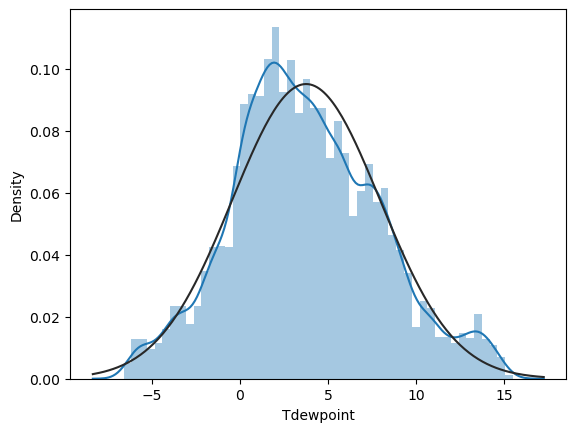

In [40]:
# Visualize the spread of Target Variable 'Tdewpoint (from Chièvres weather station)'
from scipy.stats import norm
sns.distplot(energydata['Tdewpoint'], fit=norm)
plt.show()

Observations:
- The x-axis displays dew point temperatures ranging from -5°C to 15°C. This range typically indicates varying levels of atmospheric moisture, with lower values suggesting drier air and higher values indicating moister air.
- The distribution is roughly symmetrical and appears to be unimodal with a peak around 5°C. This peak suggests that the most common dew point temperature in this dataset is near 5°C, which is a moderate level of atmospheric moisture typical in many climates.
- Analysis of Peaks:
    + Main Peak at 5°C: Indicates that this dew point temperature is the most frequent, suggesting prevailing weather conditions with moderate moisture. This temperature is often associated with comfortable weather conditions where the air is neither too dry nor too moist.
- The distribution has tails extending toward colder and warmer dew points. The left tail toward colder dew points below -5°C suggests less frequent occurrences of very dry conditions. Similarly, the right tail extending beyond 10°C toward 15°C shows less frequent but still notable occurrences of higher moisture levels, which can lead to feelings of increased humidity or mugginess.
- Understanding the distribution of dew point temperatures is crucial for various applications, including weather forecasting, agriculture, and planning outdoor activities. It provides insights into the expected moisture conditions, which can significantly affect human comfort, agricultural conditions, and the likelihood of dew or frost formation.

o. Random variable 1

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\674872615.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Random_var1'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


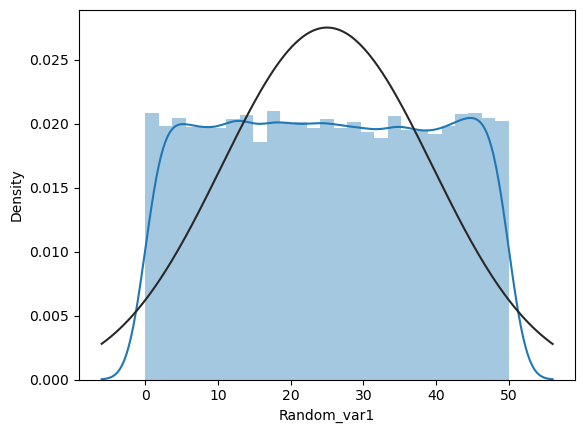

In [41]:
# Visualize the spread of Target Variable 'Random variable 1'
from scipy.stats import norm
sns.distplot(energydata['Random_var1'], fit=norm)
plt.show()

Observations:
- This axis represents the values of Random_var1, which range from 0 to about 50. The distribution of values is spread evenly across this range, suggesting that each interval within this range is equally likely to occur.
- In this case, the KDE curve shows a slight variation in density estimation, peaking towards the center of the distribution and tapering off at the edges. This might suggest some slight deviations from a perfect uniform distribution, but these deviations are minimal.
- Uniform Distribution Characteristics:
    + Flat Histogram Bars: The almost flat profile of the histogram bars across the range indicates a uniform distribution, where each segment within the range of Random_var1 has approximately the same probability of occurrence.
- The KDE curve has a bell shape, which is not typical for a uniform distribution. This shape might be influenced by the method used for density estimation or reflect slight variations in the data that don't perfectly align with a uniform model.
- This histogram is informative for understanding how Random_var1 behaves across its range and can be particularly useful for validating models where uniformity in the distribution of inputs or parameters is a critical assumption.

p. Random variable 2

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\2304891804.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(energydata['Random_var2'], fit=norm)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


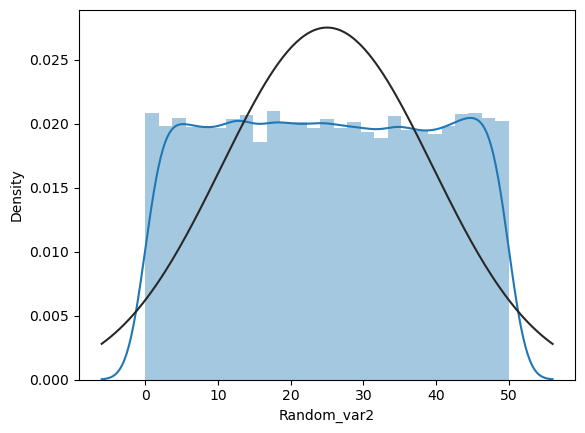

In [42]:
# Visualize the spread of Target Variable 'Random variable 2'
from scipy.stats import norm
sns.distplot(energydata['Random_var2'], fit=norm)
plt.show()

Observations:
- The axis ranges from 0 to 50, indicating the scope of the variable's possible values.
- The blue bars are nearly the same height across the entire range, suggesting that every interval within this range is equally likely to be observed. This pattern typically characterizes a uniform distribution.
- The KDE curve, a smoothed line meant to represent the underlying distribution pattern, is notably bell-shaped, peaking around the center of the range near 25 and tapering off towards the ends. This shape is characteristic of a normal distribution, not a uniform one.
- Insights:
    + Uniform Distribution Indicators:
Flat Histogram Bars: Indicate that the data points are spread uniformly across the range.
Consistency Across Range: Each value interval appears equally represented, typical of simulations or generated data where each outcome is intended to be equally probable.
    + KDE Curve Analysis:
Bell Shape: Contradictory to the histogram, the bell-shaped KDE suggests a different probability structure where values around the middle of the range are more frequent than those at the edges, a hallmark of normal distributions.
    + Possible Explanation for Discrepancy:
KDE Sensitivity: The KDE method might be overly smoothing the data, leading to the appearance of a normal distribution if the bandwidth parameter is not well-tuned to this specific data set.
Data Characteristics: If the data truly follows a uniform distribution, the KDE curve might misleadingly suggest centrality in frequency due to its smoothing nature.
- The histogram plot strongly suggests a uniform distribution for "Random_var2", characterized by equal likelihood across its range from 0 to 50. The KDE curve presents an interesting contrast, possibly due to its sensitivity to bandwidth settings or the nature of smoothing applied. For accurate interpretation, especially in technical or scientific contexts, it would be crucial to consider both the histogram and KDE, and possibly adjust KDE parameters or utilize other data visualization or statistical tools to confirm the distribution type.

ii. Scatter Plots

a. Analysis of Appliances

Kitchen and Living room area

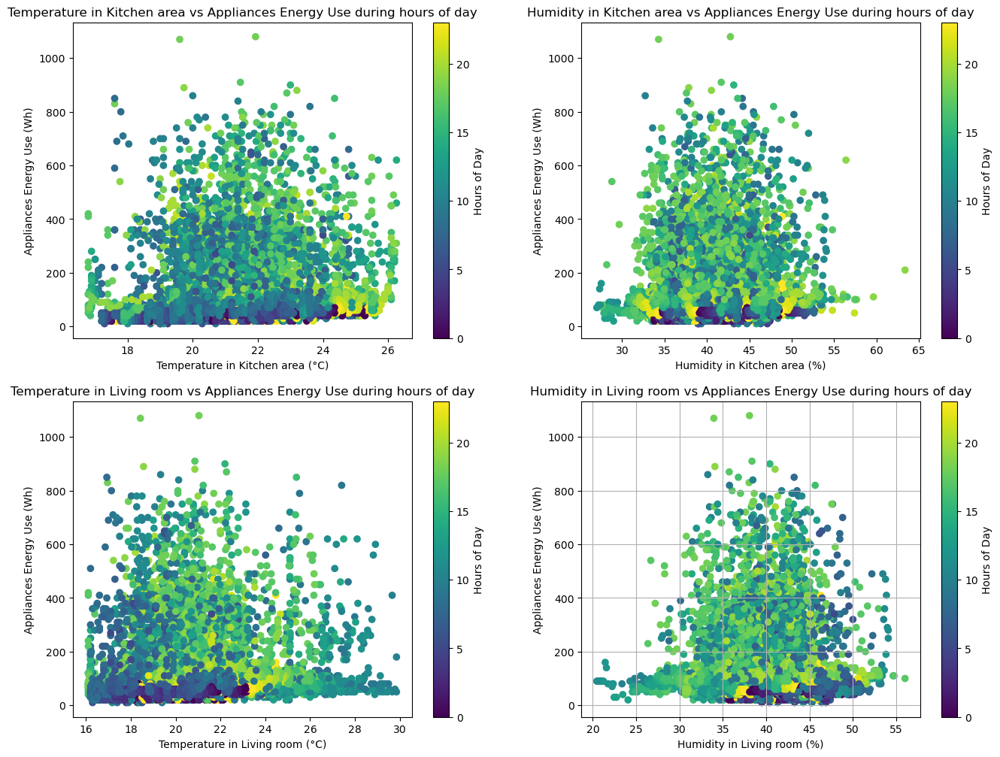

In [43]:
# Hours of day
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Kitchen vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Kitchen'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Temperature in Kitchen area vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Temperature in Kitchen area (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Kitchen vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Kitchen'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Humidity in Kitchen area vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Humidity in Kitchen area (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Living vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Living'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Temperature in Living room vs Appliances Energy Use during hours of day')
axs[2].set_xlabel('Temperature in Living room (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Living vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Living'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Humidity in Living room vs Appliances Energy Use during hours of day')
axs[3].set_xlabel('Humidity in Living room (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations (Hours of Day)
- Temperature in Kitchen Area vs Appliances Energy Use
    + There appears to be a slight trend where higher temperatures may correspond to increased appliance energy use, though the relationship is not very strong.
    + Energy use shows significant variability across the same temperature range, indicating other factors (like time of day or appliance type) also significantly influence energy consumption.
    + The color gradient suggests higher energy usage may occur during specific times of the day, possibly midday and evening hours, which are often associated with cooking and other high-energy activities.
- Humidity in Kitchen Area vs Appliances Energy Use
    + The plot does not show a clear relationship between humidity levels and appliance energy usage. The spread is fairly uniform across the range of humidity values.
    + Higher humidity values do not consistently correspond to either higher or lower energy usage, suggesting humidity might not be a significant predictor of energy use in this context.
- Temperature in Living Room vs Appliances Energy Use
    + Similar to the kitchen, there's some indication that higher temperatures might lead to higher energy usage, potentially due to the use of air conditioning or other cooling devices.
    + Energy use variability is also notable here, with no strong, consistent pattern linking temperature to energy consumption.
- Humidity in Living Room vs Appliances Energy Use
    + As with kitchen humidity, living room humidity does not show a clear influence on energy usage. The data is widely dispersed, indicating that if humidity affects energy usage, the effect is likely confounded by other more impactful variables.
- Summary:
    + The color coding (representing different hours of the day) is crucial in these plots. It highlights that time of day may be a more significant factor affecting energy usage than either temperature or humidity alone.
    + While there is some suggestion that temperature may affect energy use, the impact of humidity is less clear from these plots. Both factors show variability in energy use that could be influenced by additional variables not displayed.
    + These plots are valuable for identifying potential peak usage times and can help in adjusting energy consumption habits or improving home automation systems to enhance energy efficiency.

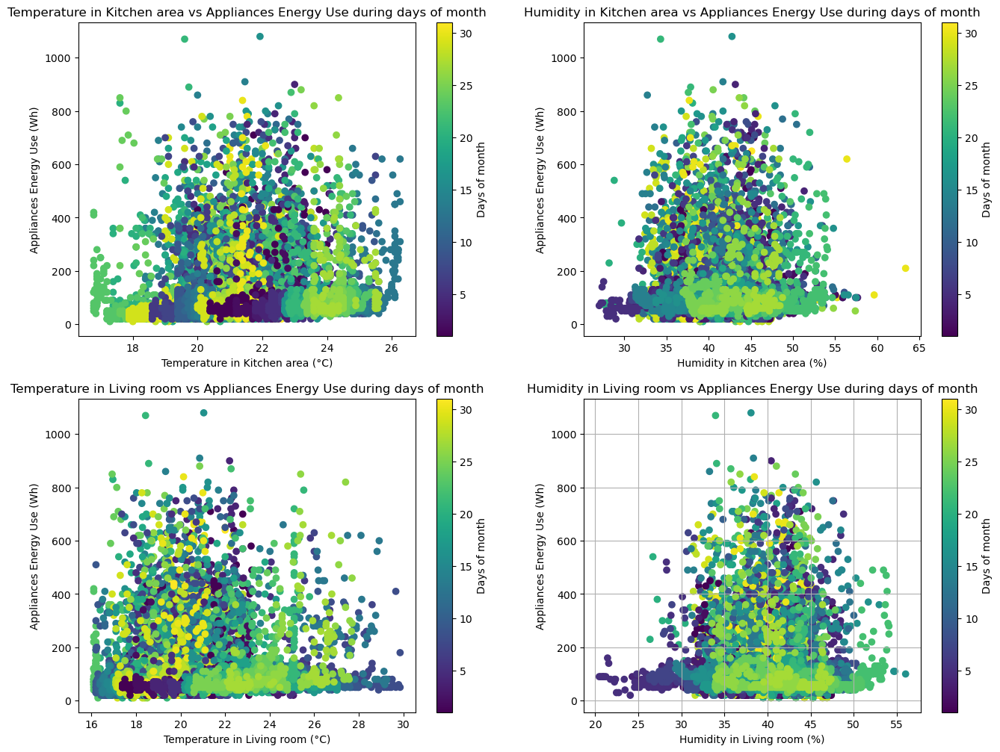

In [44]:
# Days of month
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Kitchen vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Kitchen'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Days of month')
axs[0].set_title('Temperature in Kitchen area vs Appliances Energy Use during days of month')
axs[0].set_xlabel('Temperature in Kitchen area (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Kitchen vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Kitchen'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Days of month')
axs[1].set_title('Humidity in Kitchen area vs Appliances Energy Use during days of month')
axs[1].set_xlabel('Humidity in Kitchen area (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Living vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Living'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Days of month')
axs[2].set_title('Temperature in Living room vs Appliances Energy Use during days of month')
axs[2].set_xlabel('Temperature in Living room (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Living vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Living'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Days of month')
axs[3].set_title('Humidity in Living room vs Appliances Energy Use during days of month')
axs[3].set_xlabel('Humidity in Living room (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations (Days of Month)

- Temperature in Kitchen Area vs Appliances Energy Use
    + Temperature generally ranges between 18°C to 26°C.
    + There is considerable variability in appliance energy usage at different temperatures. High energy use does not appear to be tightly correlated with higher temperatures, suggesting that factors other than just temperature may be influencing energy consumption.
    + The color gradient shows no clear pattern that correlates specific days of the month with higher or lower energy usage, indicating that temperature-driven energy use does not systematically vary throughout the month.
- Humidity in Kitchen Area vs Appliances Energy Use
    + Humidity levels range from about 30% to 65%.
    + Similar to temperature, energy usage is spread across a wide range of humidity levels, with no clear trend linking humidity with energy use.
    + Different days of the month, as shown by the colors, also do not exhibit a distinct pattern, suggesting that humidity impacts are not tied to specific times of the month.
- Temperature in Living Room vs Appliances Energy Use
    + Temperatures in the living room vary between 16°C to 30°C.
    + The plot indicates a scatter of energy use across the temperature spectrum with slightly more occurrences of higher energy use at mid-range temperatures.
    + The distribution of days across the month (indicated by color) shows no significant trend or pattern, implying that energy usage relative to living room temperature does not fluctuate systematically throughout the month.
- Humidity in Living Room vs Appliances Energy Use
    + Humidity levels vary from about 25% to 55%.
    + Energy usage shows some clustering at lower humidity levels with higher usage, but like the other variables, shows wide variability.
    + Color coding across the days of the month again shows no clear pattern, suggesting that daily fluctuations in humidity do not have a predictable monthly pattern in terms of impacting energy usage.
- Summary: 
    + These plots underscore the complexity of the relationship between environmental conditions and energy usage. No clear, consistent patterns emerge from the data based on days of the month, suggesting that while temperature and humidity affect energy use, their impact is likely modulated by other variables such as time of day, human activity, or other unmeasured environmental factors.

Comparing the two scatter plots which illustrate energy usage patterns in relation to environmental conditions (temperature and humidity) in the kitchen and living room areas based on the different time dimensions (Hours of the day and Days of the month).

- Vital Observations from the Plots:
    + Temperature in Kitchen and Living Room (Hourly and Monthly Views):
The hourly temperature shows a clear cycle of temperatures correlating with typical daily warming and cooling, potentially impacting when energy is most used. Higher usage times may correlate with higher temperatures.
The daily temperature variation is less apparent, but there may be slight indications of temperature fluctuations affecting energy use across the month.
    + Humidity in Kitchen and Living Room (Hourly and Monthly Views):
The hourly humidity peaks in energy use appear to correlate with certain times of the day, possibly when humidity is either at its highest or lowest, suggesting activities that either generate moisture (like cooking or showering) or dry the air are in operation.
The monthly humidity shows how humidity levels change over the month and their potential impact on energy usage, with no clear trend of increasing or decreasing energy usage across the month, suggesting a stable pattern in response to humidity.

Hence, comparing the daily data, the hourly one shows the clearer relationship between temperature, humidity and the energy consumption.


Laundry and Office room 

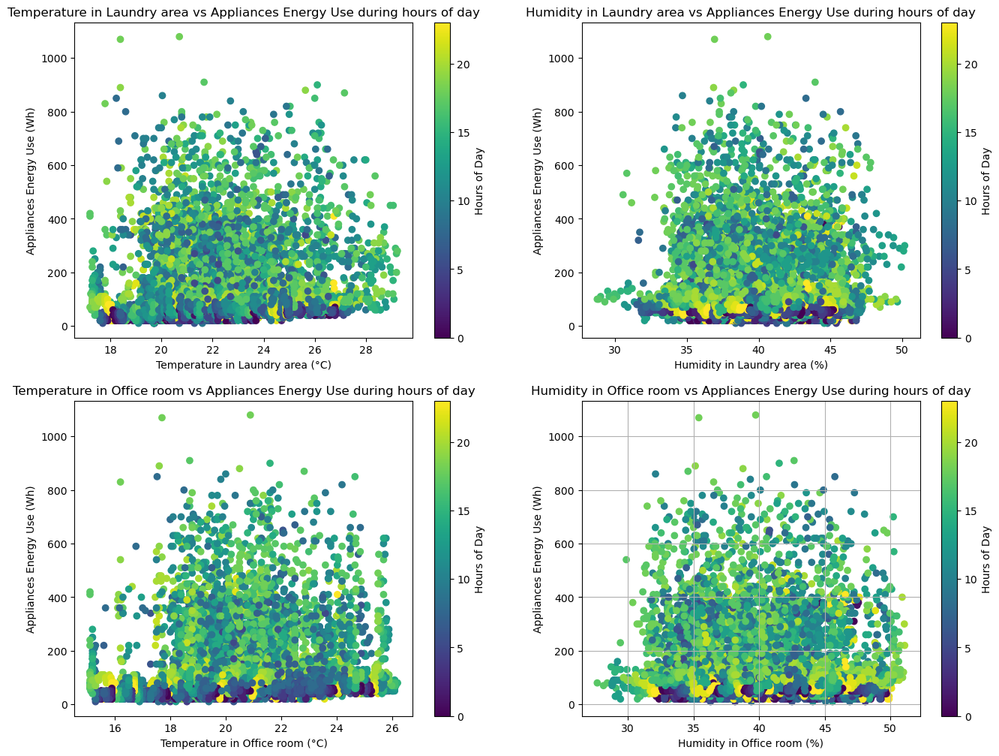

In [45]:
# Hours of Day
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Laundry vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Laundry'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Temperature in Laundry area vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Temperature in Laundry area (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Laundry vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Laundry'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Humidity in Laundry area vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Humidity in Laundry area (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Office vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Office'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Temperature in Office room vs Appliances Energy Use during hours of day')
axs[2].set_xlabel('Temperature in Office room (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Office vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Office'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Humidity in Office room vs Appliances Energy Use during hours of day')
axs[3].set_xlabel('Humidity in Office room (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()


Observations (Hours of Day)
- Temperature in Laundry Area vs Appliances Energy Use
    + Temperature range is approximately from 18°C to 28°C.
    + There's no clear trend indicating a strong relationship between temperature and energy use; however, the data suggests higher variability in energy use at temperatures around 22-24°C.
    + The color gradient shows that higher energy uses are not confined to a specific time of the day, suggesting that activities leading to higher energy consumption may not be temperature dependent.
- Humidity in Laundry Area vs Appliances Energy Use
    + Humidity values range roughly from 30% to 50%.
    + The plot shows a large spread in appliance energy usage across the humidity range, with no clear pattern or correlation visible.
    + Lower humidity levels (around 30%) occasionally coincide with higher energy usage, indicating possible specific activities that require lower humidity but more energy.
- Temperature in Office Room vs Appliances Energy Use
    + Temperature range is approximately from 16°C to 26°C.
    + Similar to the laundry area, the scatter plot does not display a strong correlation between temperature and energy usage. However, there's noticeable clustering of higher energy usage at mid-range temperatures.
    + This suggests that while temperature may influence appliance use in the office room, other factors (likely related to specific office equipment use) also play significant roles.
- Humidity in Office Room vs Appliances Energy Use
    + Humidity levels are generally between 30% and 50%.
    + The plot shows more distinct bands of higher energy usage at certain humidity levels, suggesting a possible correlation where certain humidity conditions in the office might coincide with specific uses of appliances.
    + High energy usage events are spread throughout the range but more frequent at mid-level humidity, possibly linked to air conditioning use during warmer parts of the day.
- Summary: 
    + These plots suggest that while there are environmental influences on energy usage, the relationships are complex and likely moderated by human activities, appliance efficiencies, and specific needs related to the space (like drying clothes in the laundry area or using computers in the office).
    + The use of color to indicate time of day highlights that energy usage peaks do not correlate strongly with specific times, though some tendencies can be discerned (e.g., office equipment used more during typical office hours).


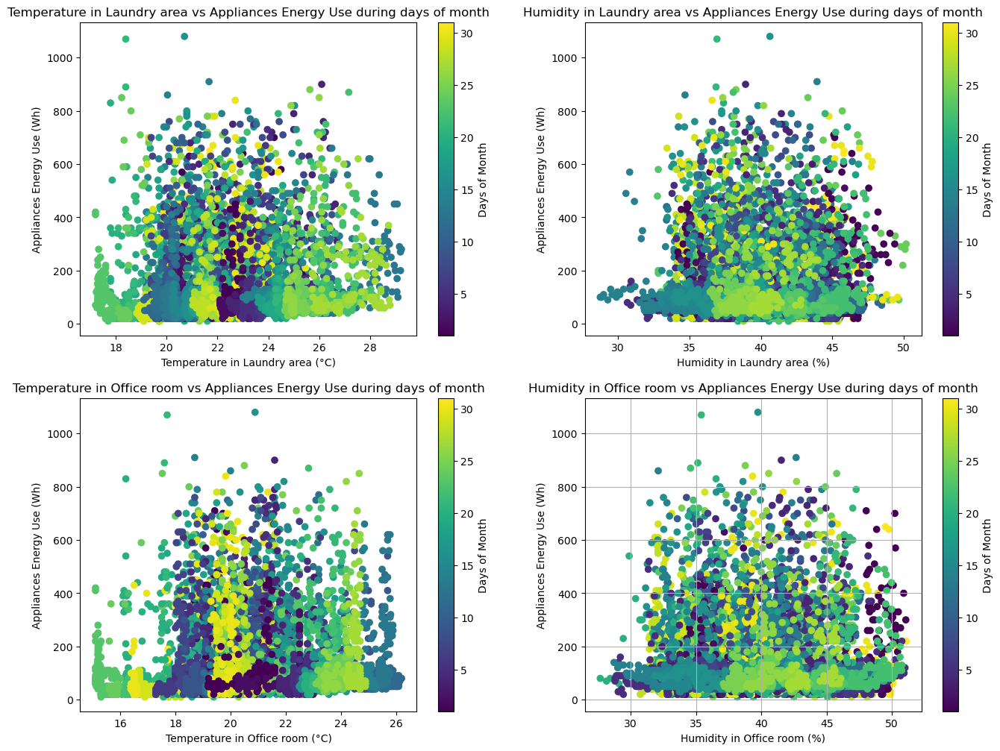

In [46]:
# Days of Month
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Laundry vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Laundry'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Days of Month')
axs[0].set_title('Temperature in Laundry area vs Appliances Energy Use during days of month')
axs[0].set_xlabel('Temperature in Laundry area (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Laundry vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Laundry'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Days of Month')
axs[1].set_title('Humidity in Laundry area vs Appliances Energy Use during days of month')
axs[1].set_xlabel('Humidity in Laundry area (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Office vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Office'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Days of Month')
axs[2].set_title('Temperature in Office room vs Appliances Energy Use during days of month')
axs[2].set_xlabel('Temperature in Office room (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Office vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Office'], energydata['Appliances'], c=energydata['day'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Days of Month')
axs[3].set_title('Humidity in Office room vs Appliances Energy Use during days of month')
axs[3].set_xlabel('Humidity in Office room (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations (Days of Month)
    The scatter plots do not show a clear correlation between the days of the month and appliance energy use for both temperature and humidity in the laundry and office areas. 
- Temperature in Laundry Area vs. Appliances Energy Use
    + Temperature ranges from 18°C to 28°C.
    + Energy usage is higher at moderate temperatures (around 24°C), suggesting appliances might be used more frequently or efficiently in these conditions.
    + Usage is relatively high throughout the month, without specific trends relating to specific days.
    + The scatter of colors is widespread across all energy use levels, indicating that the energy use does not systematically increase or decrease as the month progresses. This suggests that the day of the month does not have a direct or clear impact on how much energy appliances use in relation to temperature in the laundry area.
- Humidity in Laundry Area vs. Appliances Energy Use
    + Humidity ranges from 30% to 50%.
    + Energy usage peaks around 40% humidity, potentially indicating that certain appliances (like dryers) might be more active or effective at these levels.
    + The colors representing different days of the month are mixed throughout the energy usage levels. There’s no visible trend indicating that higher or lower humidity levels on specific days lead to changes in energy use.
- Temperature in Office Room vs. Appliances Energy Use
    + Temperature ranges from 16°C to 26°C.
    + Higher usage seems clustered around 20°C to 22°C, suggesting heating or cooling devices might be set to maintain this temperature range.
    + The color gradient shows a balanced distribution of energy usage throughout the month, with no apparent peaks.
    + This plot also shows a diverse spread of days across different temperatures. Energy use does not display any obvious trend related to advancing days in the month, with high and low usage days interspersed throughout the temperature range.
- Humidity in Office Room vs. Appliances Energy Use
    + Humidity ranges from 30% to 50%.
    + Unlike other plots, this shows less correlation between humidity and energy usage, with a more uniform distribution across different humidity levels.
    + Usage does not seem to correlate strongly with specific days of the month, as indicated by the varied color distribution.
- Summary:
    + The data across all four plots demonstrates that the variables of temperature and humidity, within the settings of a laundry and an office room, do not exhibit a clear correlation with the days of the month regarding appliance energy usage.

Comparing the two scatter plots which illustrate energy usage patterns in relation to environmental conditions (temperature and humidity) in the kitchen and living room areas based on the different time dimensions (Hours of the day and Days of the month).

- Vital Observations from the Plots:
    + Temperature in Laundry Area:
Days of the Month: Energy usage shows no clear pattern related to the specific days of the month, indicating consistent appliance use across different days, irrespective of temperature changes.
Hours of the Day: There appears to be a slight increase in energy usage during the mid-day hours, suggesting that temperature-related appliance use (likely heating or air conditioning) peaks during these hours.
    + Humidity in Laundry Area:
Days of the Month: Similar to temperature, the energy usage does not vary significantly with different days of the month, which might indicate stable environmental conditions or appliance settings throughout the month.
Hours of the Day: Higher energy usage is noticeable during the mid-day, aligning with higher operational activities or possibly the use of dehumidifiers during warmer or busier times.
    + Temperature in Office Room:
Days of the Month: The distribution of energy usage remains relatively uniform across different temperatures throughout the month, suggesting a steady need for temperature regulation.
Hours of the Day: A broad range of energy consumption across all temperatures with a slight tendency for increased usage around the middle of the day, potentially reflecting occupational patterns of office use.
    + Humidity in Office Room:
Days of the Month: No discernible pattern relating humidity levels to specific days of the month, indicating that humidity in the office room does not fluctuate significantly in terms of affecting energy usage.
Hours of the Day: The energy usage shows a subtle increase during mid-day hours, consistent with other observations, suggesting increased activity or device usage during this time frame.
- Summary:
The hours of the day reveals more about usage patterns than the days of the month, indicating that energy consumption in both the laundry and office areas is more sensitive to the time of day rather than day-to-day variations throughout the month.

While examining the correlation relationship between the previous variables (The temperature and humidity of Kitchen and Living room area, as well as the temperature and humidity of Laundry and Office room) and the energy usage based on the data (days of month), the scatter plots do not demonstrate a clear correlation between the days of the month and appliance energy usage for either temperature or humidity in the those areas.

Hence, it is better to focus on the data (hours of day) to analyse the correlation between appliance energy usage and other variables.

Bathroom and Northside_Outside_Building area

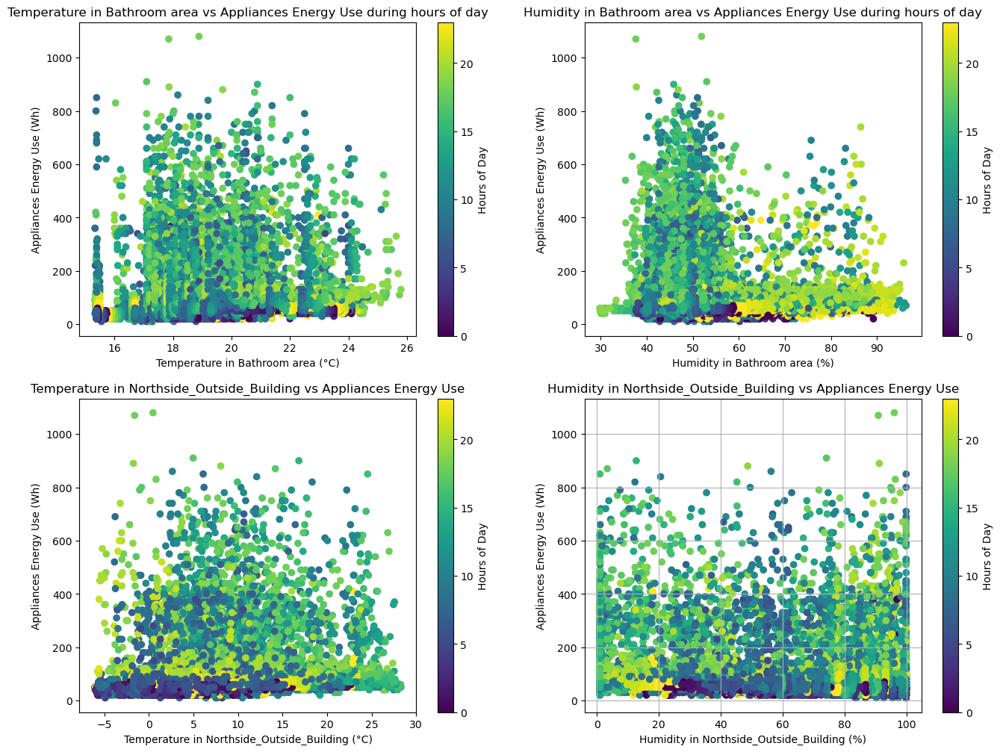

In [47]:
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Bathroom vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Bathroom'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Temperature in Bathroom area vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Temperature in Bathroom area (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Bathroom vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Bathroom'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Humidity in Bathroom area vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Humidity in Bathroom area (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Northside_Outside_Building vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Northside_Outside_Building'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Temperature in Northside_Outside_Building vs Appliances Energy Use')
axs[2].set_xlabel('Temperature in Northside_Outside_Building (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Northside_Outside_Building vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Northside_Outside_Building'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Humidity in Northside_Outside_Building vs Appliances Energy Use')
axs[3].set_xlabel('Humidity in Northside_Outside_Building (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations:
- Temperature in Bathroom Area vs Appliances Energy Use
    + The temperature range is from about 16°C to 26°C.
    + The energy usage displays a wide spread across the temperature range without a clear trend suggesting a direct relationship. Higher energy usage seems to be slightly more common at higher temperatures, but significant variability exists.
    + The color gradient indicates that higher energy usage does not strongly correlate with specific times of day, although some high usage points in warmer colors suggest more activity during the day.
- Humidity in Bathroom Area vs Appliances Energy Use
    + Humidity levels vary from about 30% to 90%.
    + Similar to temperature, there is significant scatter in energy usage across different humidity levels. Lower energy usage is generally noted across the span with slight increases in higher humidity ranges.
    + The plot shows no consistent pattern in energy usage relative to different times of the day based on the color gradient.
- Temperature Outside Northside of Building vs Appliances Energy Use
    + Temperature ranges from below 0°C to above 25°C.
    + This plot shows a broad dispersion of energy usage values across the temperature range, indicating no clear correlation. Notably, there are peaks of high energy use at both lower and higher temperatures.
    + The color coding does not show a clear trend linking time of day to higher or lower energy usage, although more variability in color at extreme temperatures suggests some influence.
- Humidity Outside Northside of Building vs Appliances Energy Use
    + Humidity ranges broadly from around 20% to nearly 100%.
    + There is a noticeable trend where the lowest energy usage seems to occur at mid-range humidity levels, with more variability and some higher usage at both lower and higher extremes of humidity.
    + The distribution of colors suggests variability in usage throughout different times of the day, with no clear pattern indicating a time-dependent trend.
- Summary
    + These plots suggest that while environmental conditions affect appliance energy usage, the relationships are complex. Factors like the specific appliances in use, behavioral patterns of residents, and other unmeasured environmental conditions may also play significant roles.
    + Understanding these dynamics can be critical for designing energy efficiency measures, especially in terms of optimizing the use of heating, cooling, and ventilation systems based on external and internal environmental conditions.

Ironing and Teenager_room2 area

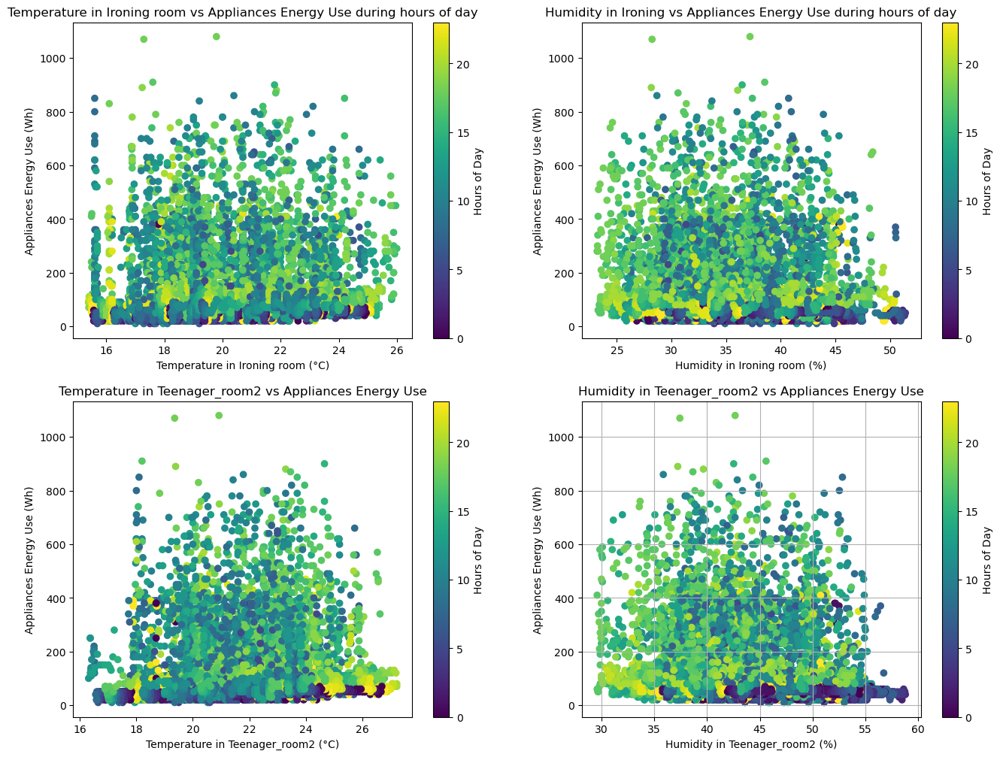

In [48]:
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Ironing vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Ironing'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Temperature in Ironing room vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Temperature in Ironing room (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Ironing vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Ironing'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Humidity in Ironing vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Humidity in Ironing room (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Teenager_room2 vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Teenager_room2'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Temperature in Teenager_room2 vs Appliances Energy Use')
axs[2].set_xlabel('Temperature in Teenager_room2 (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Teenager_room2 vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Teenager_room2'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Humidity in Teenager_room2 vs Appliances Energy Use')
axs[3].set_xlabel('Humidity in Teenager_room2 (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations:
- Temperature in Ironing Room vs Appliances Energy Use
    + The temperature range is approximately from 16°C to 26°C.
    + The energy usage shows a relatively wide distribution across the temperature range with no clear trend suggesting a strong dependence on temperature.
    + Higher energy usages are observed across various times of day, but there is a noticeable concentration of higher usage in the late hours (warmer colors), possibly due to typical household routines.
- Humidity in Ironing Room vs Appliances Energy Use
    + Humidity levels range roughly from 25% to 50%.
    + Energy use is spread across the range of humidity levels, with a significant portion of higher energy usage appearing at mid-range humidity levels.
    + The color distribution indicates varied energy use throughout the day, with no specific pattern linked to time of day, suggesting that humidity might not be a direct driver of when energy is used.
- Temperature in Teenager's Room vs Appliances Energy Use
    + Temperature ranges from about 16°C to 26°C.
    + Similar to the ironing room, there is no apparent strong correlation between temperature and energy usage. However, the plot indicates sporadic high energy usage at various temperatures.
    + Color coding shows that higher energy use does not strongly correlate with a specific time of day, although there are hints of more substantial usage during midday hours.
- Humidity in Teenager's Room vs Appliances Energy Use
    + Humidity ranges from about 30% to 60%.
    + There's a cluster of higher energy use at mid to high humidity levels, though the overall spread suggests that humidity alone isn't a strong predictor of energy use.
    + The usage times, indicated by color, vary widely, suggesting that activities leading to higher energy consumption in this room are not strongly dependent on specific humidity levels.
- Summary:
    + These plots affirm the complex interaction between environmental conditions and energy usage. While there is no direct correlation that strongly predicts energy use based on temperature or humidity alone, the plots suggest that other factors, possibly including the specific uses of rooms or the behaviors of occupants, significantly influence energy consumption.
    + The diverse color distributions across all plots illustrate that energy use in residential settings does not adhere strictly to environmental conditions but rather to human behavior and household routines.

Parents room and Outside area

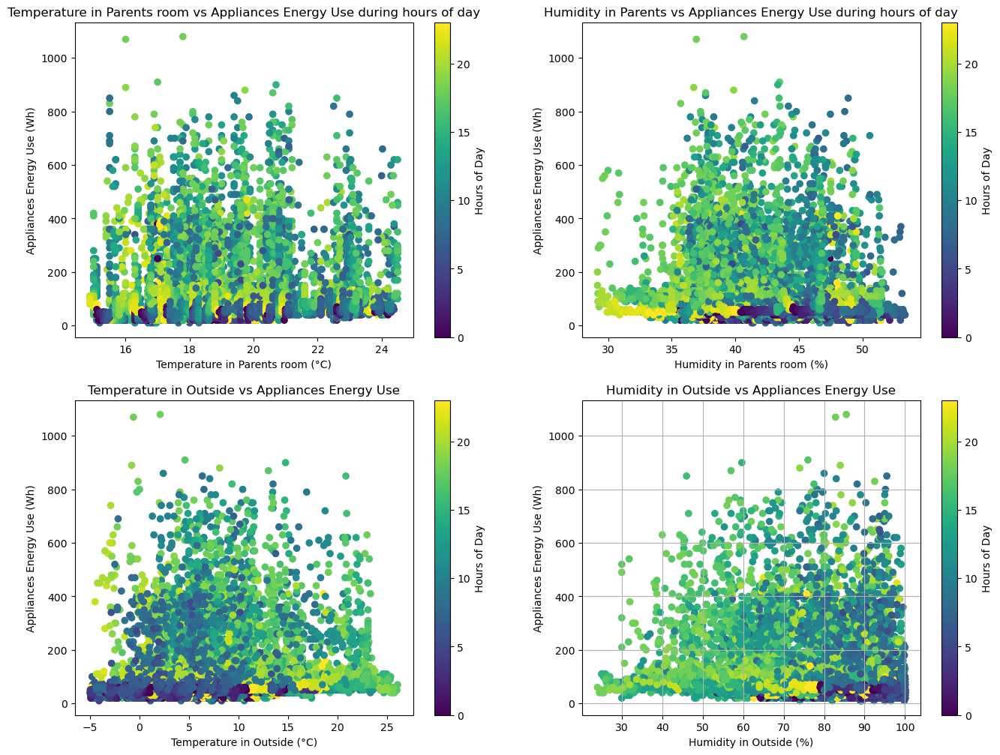

In [49]:
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Temperature_Parents vs Appliances
sc1 = axs[0].scatter(energydata['Temperature_Parents'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Temperature in Parents room vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Temperature in Parents room (°C)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Parents vs Appliances
sc2 = axs[1].scatter(energydata['Humidity_Parents'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Humidity in Parents vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Humidity in Parents room (%)')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Temperature_Outside vs Appliances
sc3 = axs[2].scatter(energydata['Temperature_Outside'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Temperature in Outside vs Appliances Energy Use')
axs[2].set_xlabel('Temperature in Outside (°C)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Humidity_Teenager_room2 vs Appliances
sc4 = axs[3].scatter(energydata['Humidity_Outside'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Humidity in Outside vs Appliances Energy Use')
axs[3].set_xlabel('Humidity in Outside (%)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations:
- Temperature in Parents' Room vs Appliances Energy Use
    + Temperatures range from approximately 16°C to 24°C.
    + The scatter plot shows a broad spread of appliance energy use across the temperature range, suggesting no clear or strong correlation between temperature and energy use. However, there is a slight concentration of higher energy usage at higher temperatures.
    + The distribution of colors indicates that higher energy uses are scattered throughout the day, with no predominant time clearly associated with increased or decreased energy use.
- Humidity in Parents' Room vs Appliances Energy Use
    + Humidity levels range from about 30% to just over 50%.
    + Energy use appears somewhat uniform across different levels of humidity, although there's a slight increase in variability and maximum energy use at mid-range humidity levels.
    + The color gradient shows a somewhat even distribution of energy use across different times of the day, with no clear patterns tied to specific humidity levels.
- Temperature Outside vs Appliances Energy Use
    + External temperatures vary widely from below -5°C to above 25°C.
    + The plot reveals a wide dispersion of energy usage values across this temperature range. Notably, there doesn’t appear to be a straightforward relationship between outside temperature and internal appliance use.
    + The color gradient does not reveal a strong correlation between time of day and energy use relative to external temperature, though there seems to be slightly higher usage during cooler temperatures (potentially early mornings or late evenings).
- Humidity Outside vs Appliances Energy Use
    + Outside humidity ranges from around 30% to 100%.
    + There is significant variability in energy usage at different humidity levels, with a notable amount of higher energy use occurring at higher humidity levels. This could indicate activities such as the use of dehumidifiers or air conditioning systems during humid conditions.
    + The plot shows a dense clustering of lower energy use at mid-range humidity and more variability in usage at higher humidity levels, particularly during specific times of day (as indicated by varying colors).
- Summary:
    + These plots reinforce the complexity of the relationships between environmental conditions and appliance energy usage. While direct correlations may not be evident, the visualizations suggest that external environmental conditions potentially influence internal conditions and subsequent energy use.

Atmospheric Presure, Windspeed, Visibility and Tdewpoint

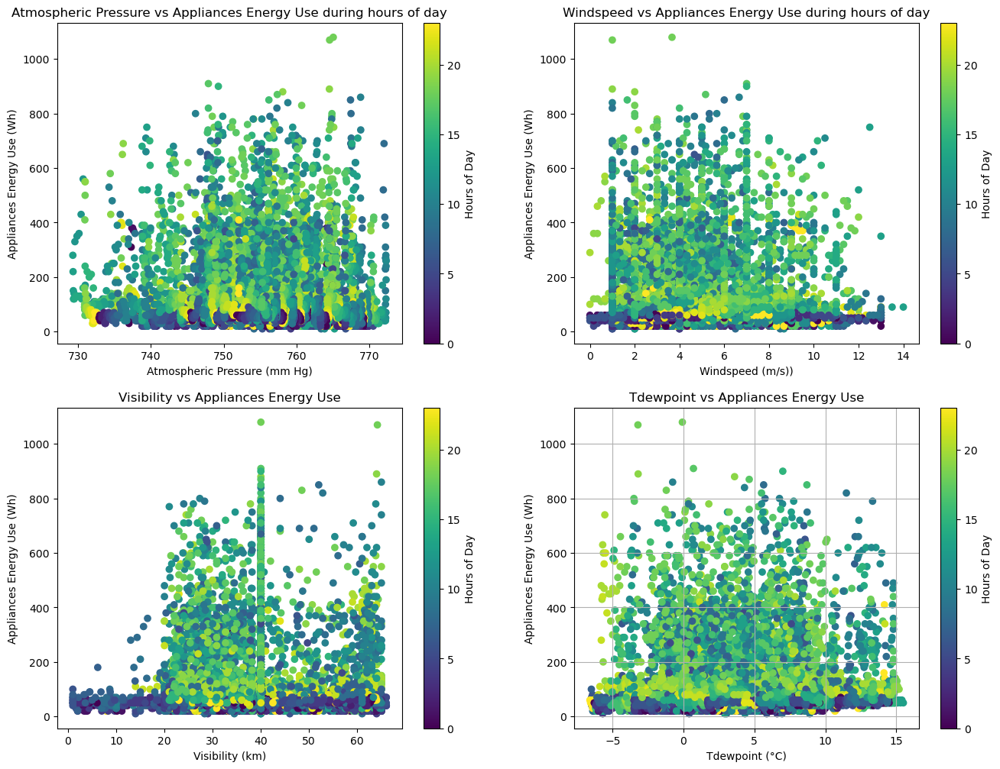

In [50]:
# Set up a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Flatten the axs array for easier indexing if needed
axs = axs.flatten()

# Pressure vs Appliances
sc1 = axs[0].scatter(energydata['Pressure'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc1, ax=axs[0], label='Hours of Day')
axs[0].set_title('Atmospheric Pressure vs Appliances Energy Use during hours of day')
axs[0].set_xlabel('Atmospheric Pressure (mm Hg)')
axs[0].set_ylabel('Appliances Energy Use (Wh)')

# Windspeed vs Appliances
sc2 = axs[1].scatter(energydata['Windspeed'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc2, ax=axs[1], label='Hours of Day')
axs[1].set_title('Windspeed vs Appliances Energy Use during hours of day')
axs[1].set_xlabel('Windspeed (m/s))')
axs[1].set_ylabel('Appliances Energy Use (Wh)')

# Visibility vs Appliances
sc3 = axs[2].scatter(energydata['Visibility'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc3, ax=axs[2], label='Hours of Day')
axs[2].set_title('Visibility vs Appliances Energy Use')
axs[2].set_xlabel('Visibility (km)')
axs[2].set_ylabel('Appliances Energy Use (Wh)')

# Tdewpoint vs Appliances
sc4 = axs[3].scatter(energydata['Tdewpoint'], energydata['Appliances'], c=energydata['hour'], cmap='viridis')
fig.colorbar(sc4, ax=axs[3], label='Hours of Day')
axs[3].set_title('Tdewpoint vs Appliances Energy Use')
axs[3].set_xlabel('Tdewpoint (°C)')
axs[3].set_ylabel('Appliances Energy Use (Wh)')

plt.grid(True)
plt.show()

Observations:
- Atmospheric Pressure vs Appliances Energy Use
    + Pressure values range approximately from 730 to 770 mm Hg.
    + The plot does not show a clear correlation between atmospheric pressure and energy usage; however, there's a wide spread of usage at different pressures.
    + Energy usage peaks at various times throughout the day, as indicated by the color spread, suggesting no strong time-specific pattern related to atmospheric pressure.
- Windspeed vs Appliances Energy Use
    + Windspeed ranges from 0 to approximately 14 m/s.
    + The energy usage shows significant scatter across the range of windspeed, with a noticeable cluster of higher usage at lower windspeeds and tapering off as windspeed increases.
    + The distribution of usage across different times of the day varies, with no apparent trend linking windspeed to specific times of high energy use.
- Visibility vs Appliances Energy Use
    + Visibility varies widely from about 0 to over 60 km.
    + There's substantial variability in energy usage at different levels of visibility. Particularly, there is a concentration of data points at higher visibility levels with a broad range of energy usage values.
    + The colors indicate that higher energy usage does not correlate strongly with specific times of the day, although mid to low visibility levels appear to show more usage at earlier hours (darker colors).
- Tdewpoint vs Appliances Energy Use
    + Dew point temperature ranges from about -5°C to 15°C.
    + This plot displays a broad scatter of energy use across the range of dew point temperatures. Notably, higher energy usage appears more frequent at higher dew point temperatures, possibly due to increased use of dehumidifiers or air conditioning.
    + The color gradient suggests varied energy use throughout the day, with a slight increase in energy use during hours corresponding to higher dew points.
- Summary:
    + These plots highlight the intricate relationships between different environmental conditions and appliance energy usage. While there is no straightforward correlation evident, the variability in energy usage across different conditions suggests complex interactions.
    + The color coding in these plots is instrumental in showing that appliance energy usage does not consistently correlate with any specific environmental condition at particular times of the day.

Visualising Scatter plot with lights usage by hours of day

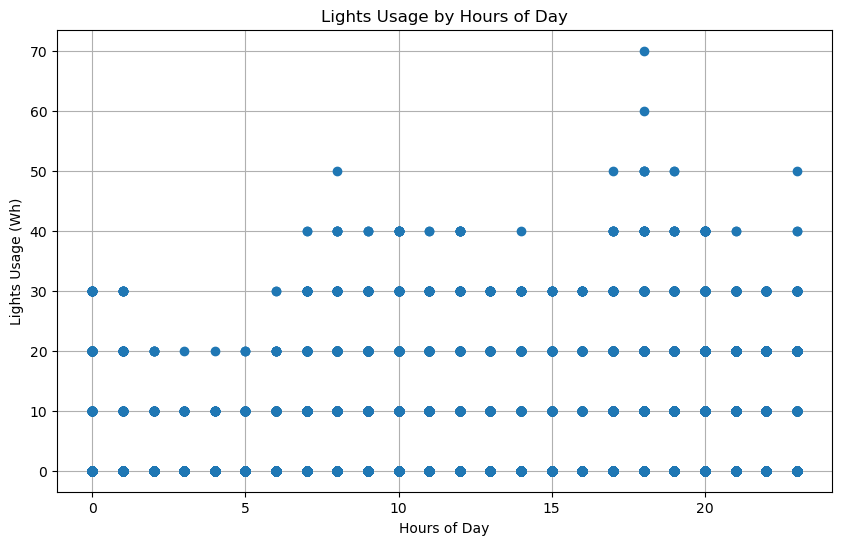

In [51]:
# Plotting lights usage across different hours of the day
plt.figure(figsize=(10, 6))
plt.plot(energydata['hour'], energydata['lights'], marker='o', linestyle='')
plt.title('Lights Usage by Hours of Day')
plt.xlabel('Hours of Day')
plt.ylabel('Lights Usage (Wh)')
plt.grid(True)
plt.show()

Observations:
- There's a distinct pattern where light usage spikes significantly during the early hours (around midnight to early morning) and again in the late evening (around 20:00 or 8 PM). These times typically coincide with when natural light is low, indicating increased reliance on artificial lighting.
- During daytime hours (from around 6 AM to 6 PM), the usage is consistently low, likely due to natural daylight reducing the need for artificial lighting.
- The points during peak times (night and late evening) show higher variability in usage, with some points reaching as high as 70 Wh. This variability could indicate different levels of activity or occupancy during these times.
Conversely, the consistency in lower usage during the day suggests a stable pattern likely tied to daylight availability.
- The intensity of usage, as seen in the scatter plot, suggests that the most significant consumption of light energy occurs during nighttime. This pattern is typical for residential areas where lighting is essential after sunset.

Implications:
- Understanding these patterns can help in designing energy efficiency measures such as automated lighting systems that adjust based on natural light availability or occupancy sensors that turn lights off when rooms are unoccupied.
- Such data can also be useful in assessing the impact of daylight savings time adjustments on energy consumption.
- This plot can provide insights into the behavioral patterns of occupants, showing when they are most likely to be active and requiring artificial lighting.


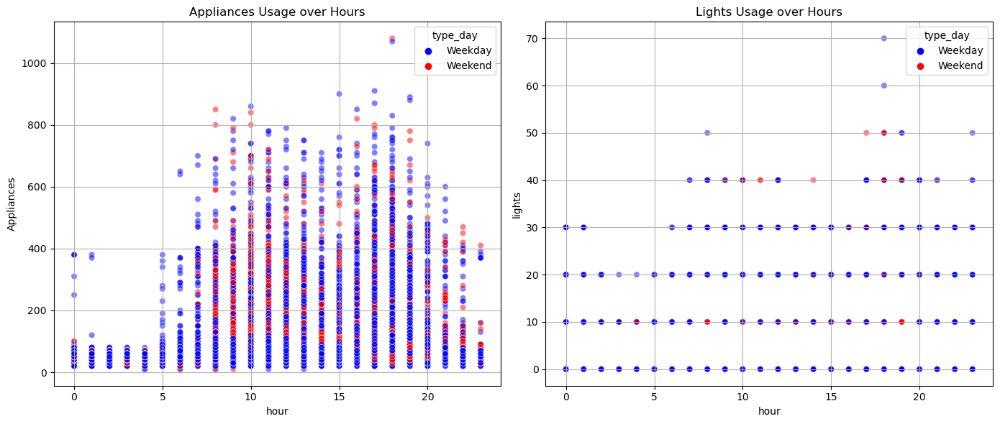

In [52]:
# Appliances and Lights usage over hours during weekdays and weekends.
# Adjusting the 'type_day' column for better legends
energydata['type_day'] = energydata['weekend'].map({0: 'Weekday', 1: 'Weekend'})

# Setting up the figure for Appliances
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(data=energydata, x='hour', y='Appliances', hue='type_day', palette={'Weekday': 'blue', 'Weekend': 'red'}, alpha=0.5)
plt.title('Appliances Usage over Hours')
plt.grid(True)

# Setting up the figure for Lights
plt.subplot(1, 2, 2)
sns.scatterplot(data=energydata, x='hour', y='lights', hue='type_day', palette={'Weekday': 'blue', 'Weekend': 'red'}, alpha=0.5)
plt.title('Lights Usage over Hours')
plt.grid(True)

plt.tight_layout()
plt.show()

Observations:
- Light usage appears more consistent across different hours, with less variability in the amount of usage compared to appliances.
- There appears to be relatively stable light usage during evening hours across both weekdays and weekends, which may reflect typical daily routines.
- Weekend data points for lights are less variable and less frequent, possibly due to people spending more time outside of the home or using natural daylight more effectively.
- Both plots reveal underlying patterns about how appliances and lights are used differently during weekdays versus weekends. Appliances show significant variability, possibly influenced by work schedules and daily routines. Light usage appears more stable, reflecting a baseline level of activity in homes regardless of the day of the week.
- The concentration of blue dots during certain hours on weekdays suggests peak usage times, likely morning and evening. The spread of red dots on weekends, especially for appliances, indicates more varied usage times, possibly due to different weekend activities.

iii. Histogram

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


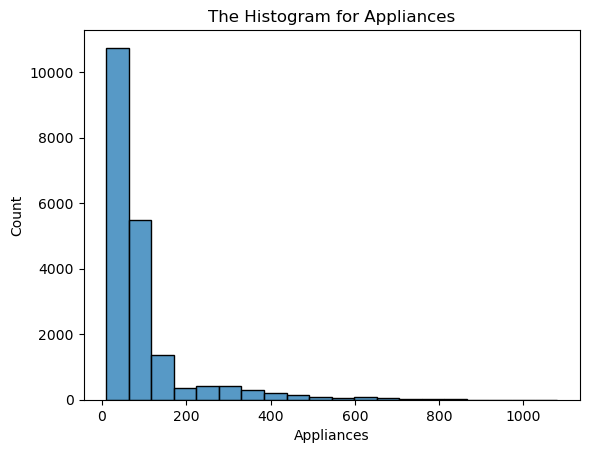

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


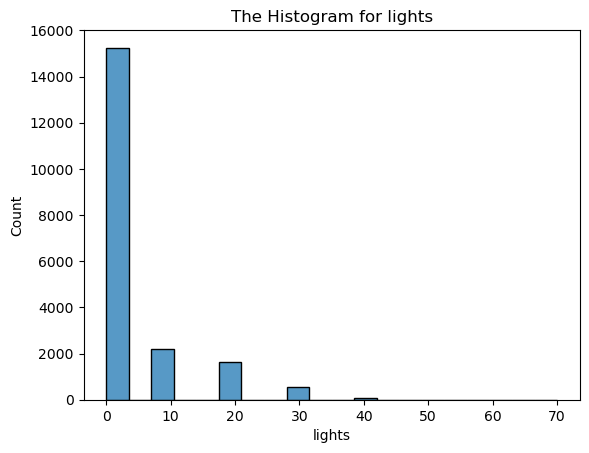

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


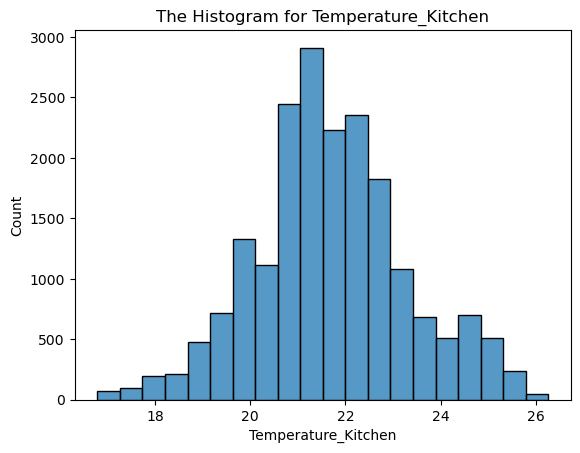

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


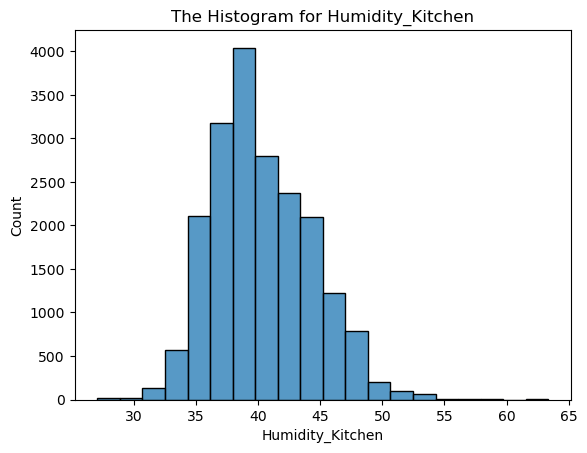

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


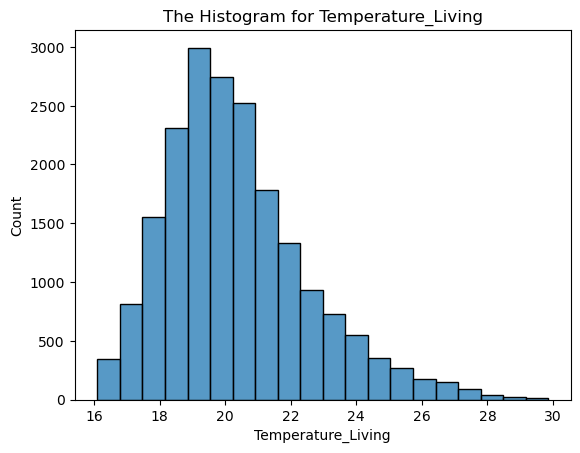

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


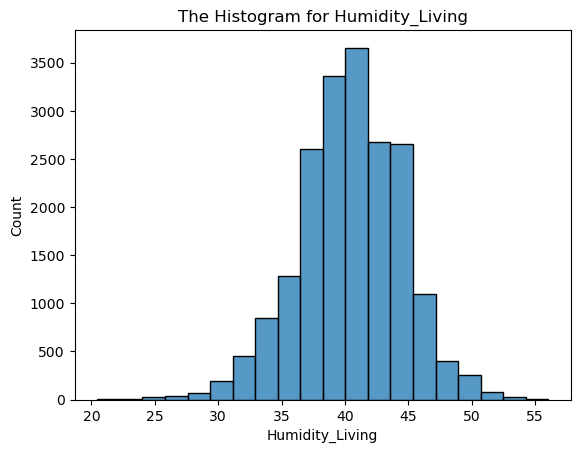

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


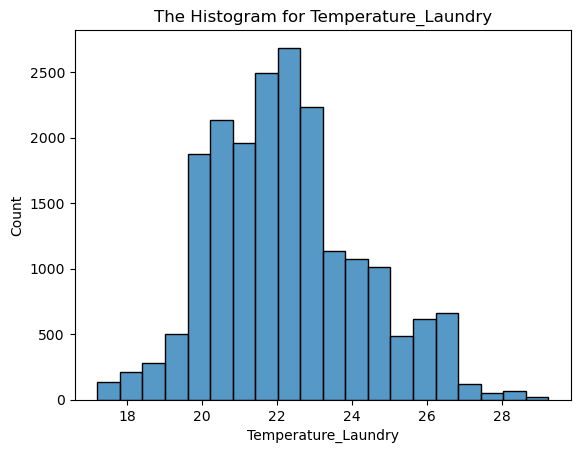

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


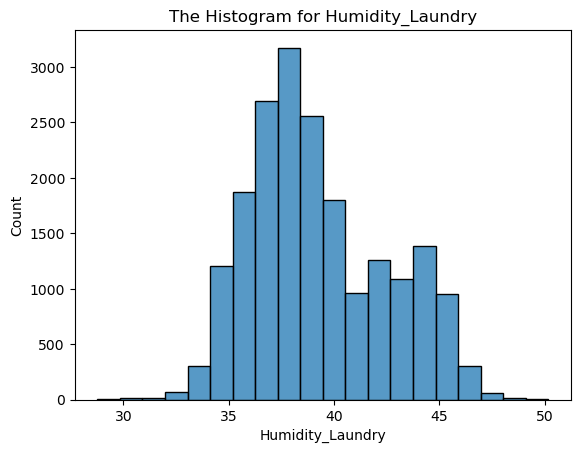

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


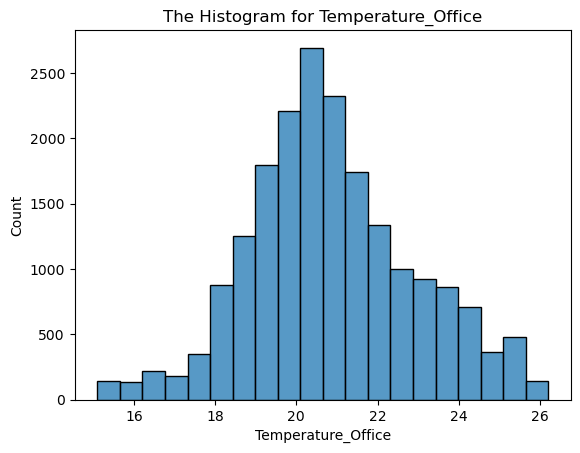

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


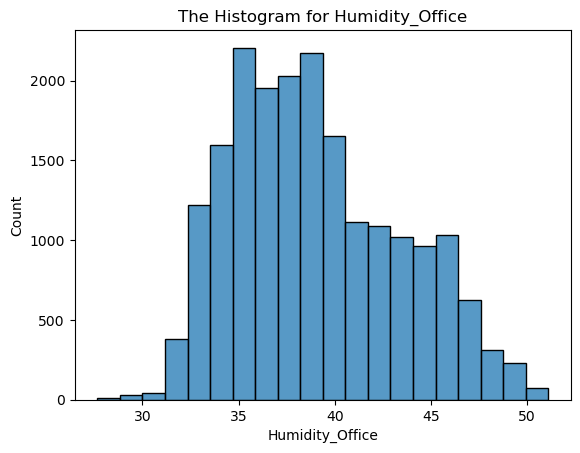

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


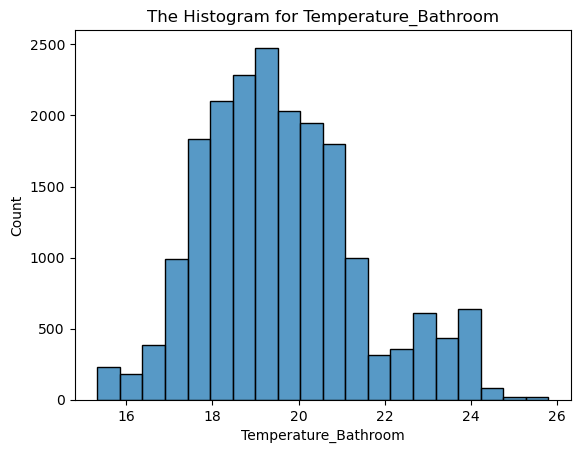

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


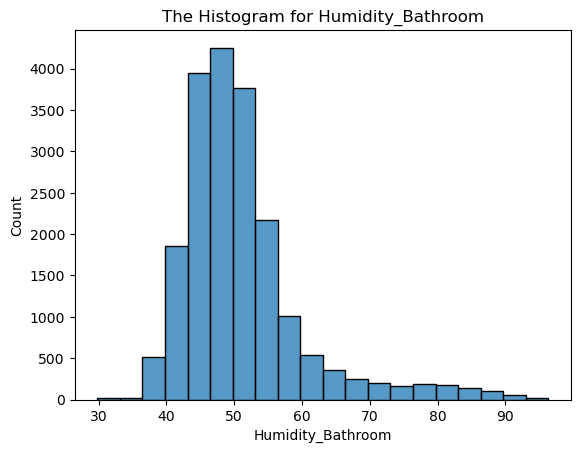

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


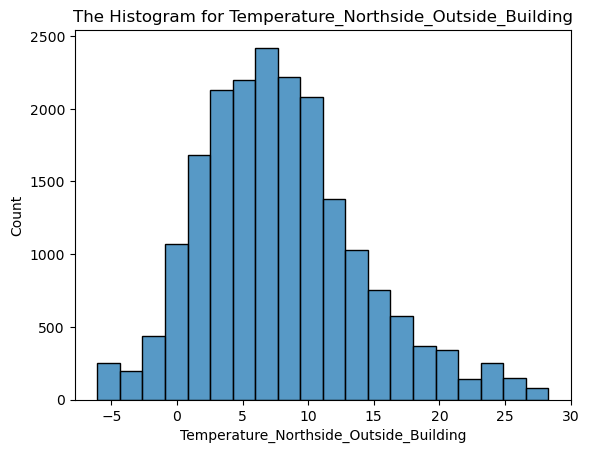

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


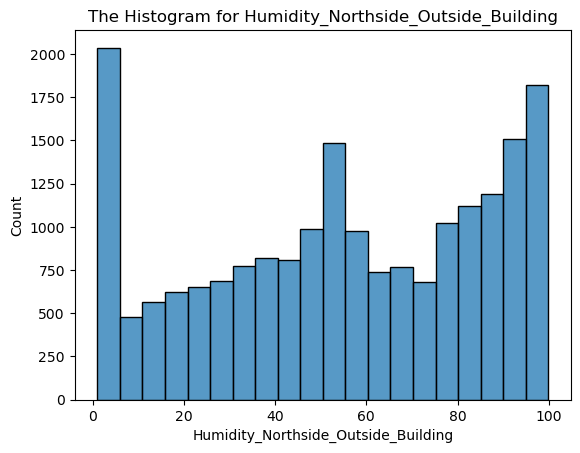

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


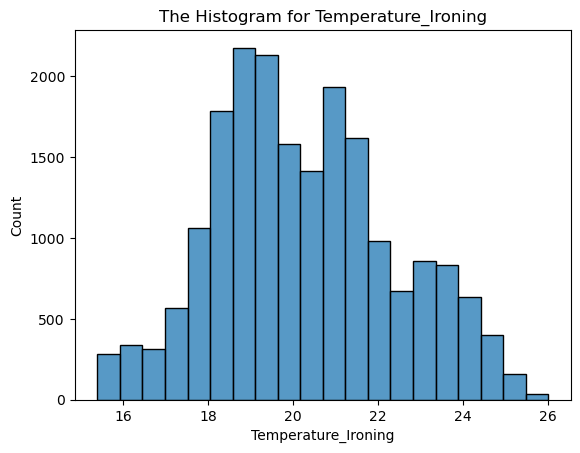

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


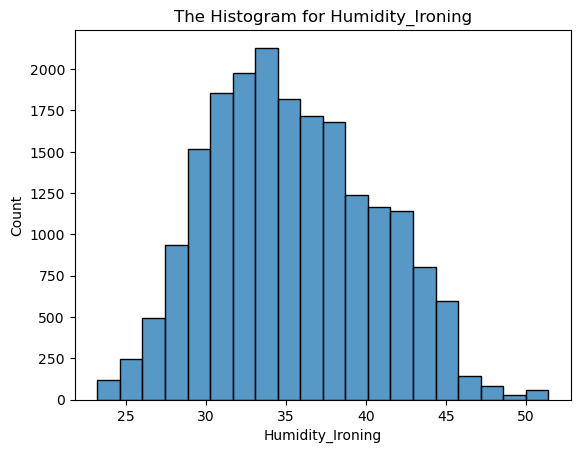

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


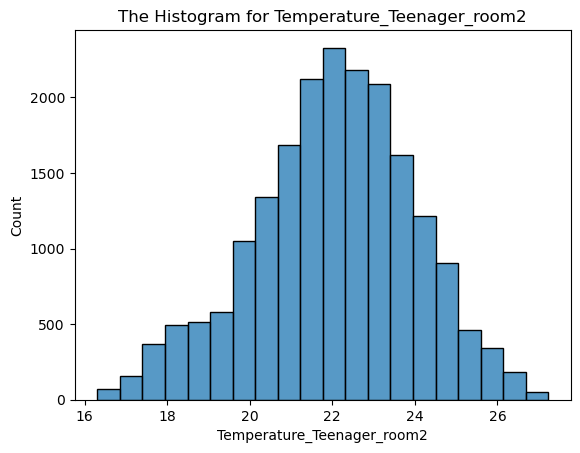

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


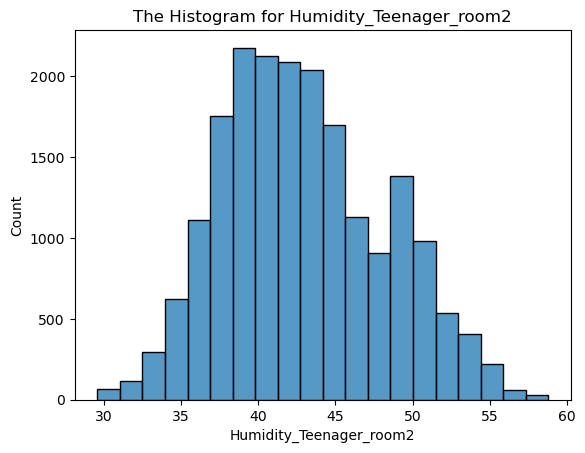

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


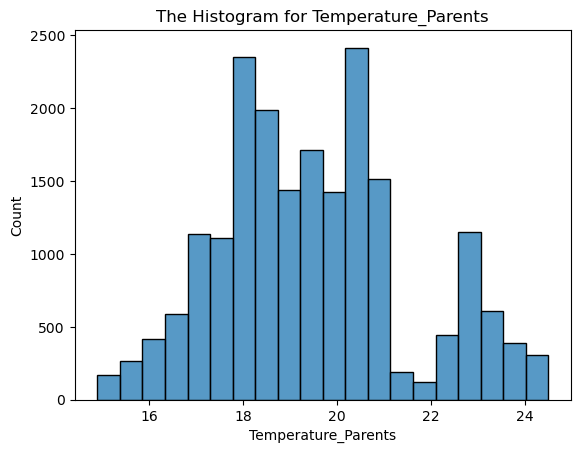

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


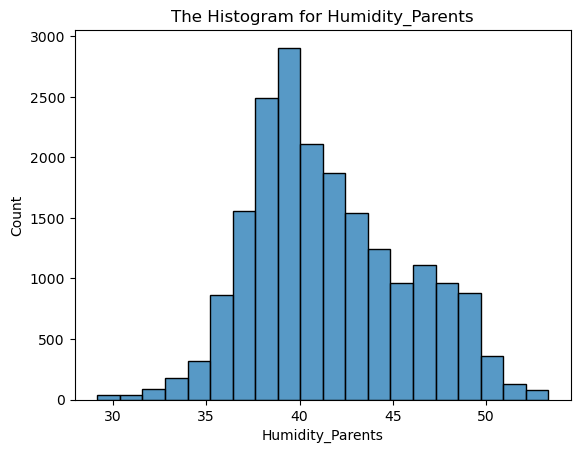

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


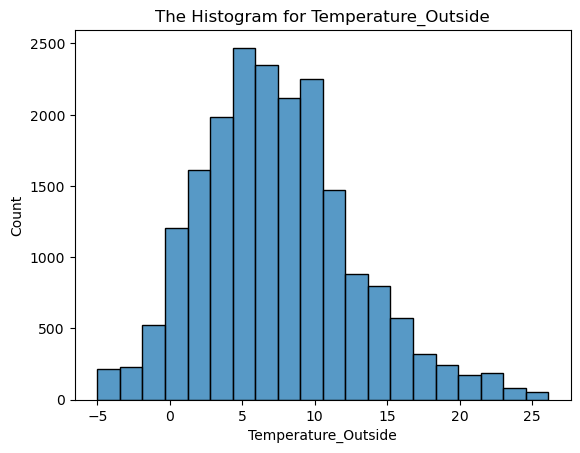

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


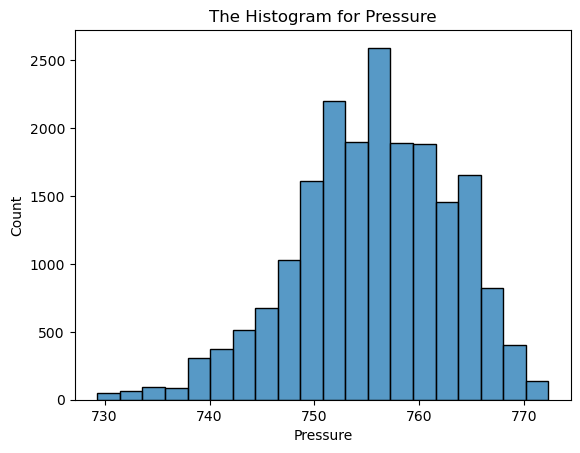

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


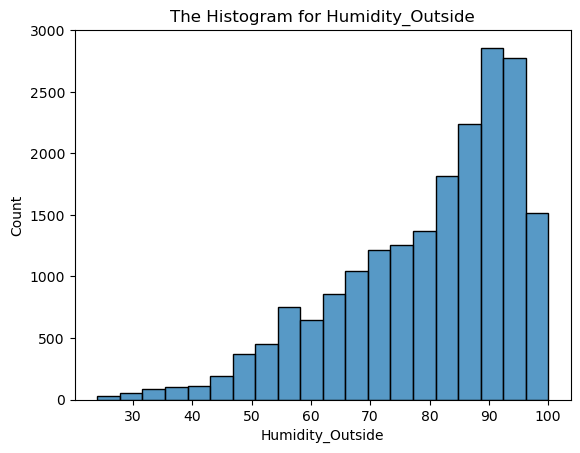

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


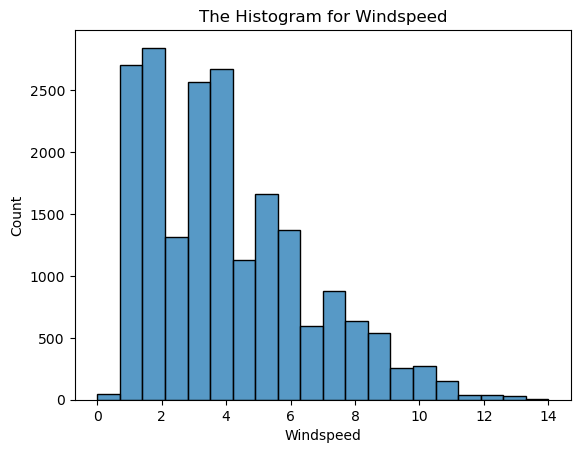

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


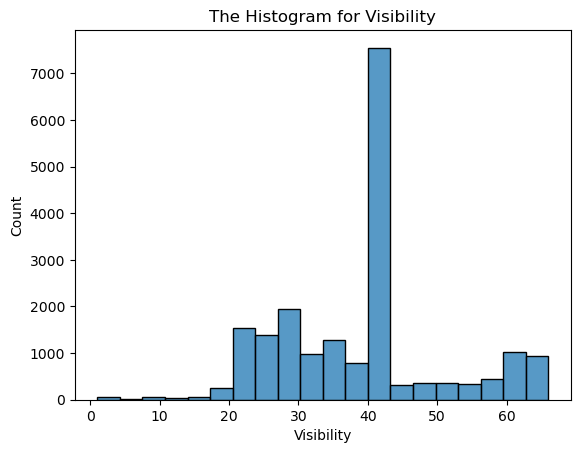

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


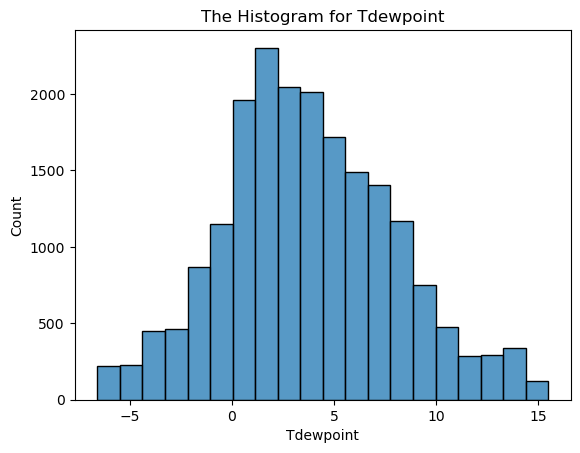

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


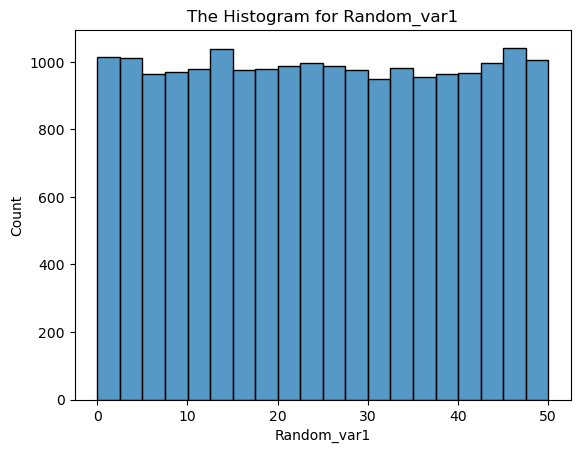

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\1474371241.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(x=energydata[i], palette='Set1',bins=20)
c:\Users\HP\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


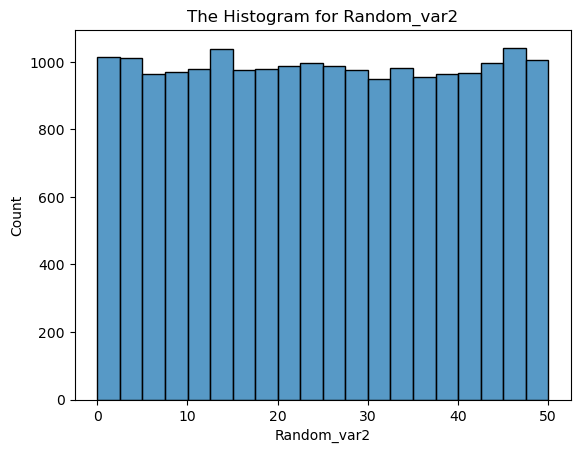

In [53]:
# Histogram for numeric_data
for i in numeric_data:
    sns.histplot(x=energydata[i], palette='Set1',bins=20)
    plt.title("The Histogram for {}".format(i))
    plt.show()

* Histograms for Appliances, Lights, Temperature and Humidity for Kitchen, Living, Laundry, Office
- Histogram for Appliances
    + The histogram is heavily skewed to the right. Most of the data points are concentrated near lower values with a peak around 0 to 200 watts, indicating that lower energy usage by appliances is much more common.
    + Low energy consumption is predominant, which might suggest either efficient appliance usage or limited use of high-consuming appliances in the sampled population.
- Histogram for Lights
    + This histogram is also right-skewed. The majority of values are at or near 0, indicating lights are off most of the time, with few instances showing higher wattage use.
    + Lights are generally not used or are used with low intensity, which could reflect efficient usage or behavior to minimize energy consumption.

- Histograms for Temperature and Humidity (Kitchen, Living, Laundry, Office)
    + Kitchen: Both temperature and humidity histograms show more variability compared to other rooms, indicating frequent changes possibly due to cooking and other activities.
    + Living Room: The temperature distribution shows a broad range, suggesting varied preferences or uses of this space.
    + Laundry: The peak in the humidity histogram is shifted towards higher values, as expected for an area frequently exposed to moisture.
    + Office: Shows moderate control in temperature and humidity, conducive to a working environment.
    + Moreover, these histograms for temperature in different locations show a roughly normal distribution (bell-shaped), but with varying degrees of skewness. The peaks typically lie in the middle range of the temperatures observed.
    + The relatively normal distribution suggests a stable and controlled environment, likely managed by heating, ventilation, and air conditioning systems.
    + Similar to temperature, the histograms for humidity are somewhat bell-shaped but often skewed towards higher values, particularly in the laundry area. This could indicate moisture generation from activities like cooking or laundry.
    + Higher humidity in specific areas may require attention to prevent mold growth or other moisture-related issues.

* Histograms for Temperature and Humidity for Bathroom, Northside Outside Building, Ironing Area, Teenager's Room2, Parents' Room

- Bathroom
    + The distribution of temperature is somewhat normally distributed with a slight right skew, showing most common temperatures around 20 to 22 degrees Celsius.
    + This histogram of humidity shows a left-skewed distribution, where most measurements are centered around 40-60% humidity, with a peak around 50%. This indicates relatively stable humidity levels with occasional higher readings, common in bathroom environments due to steam and water usage.
- Northside Outside Building
    + The temperature distribution outside on the north side shows a wide range, with a peak around 10 to 15 degrees Celsius. This wide range suggests exposure to varying outdoor conditions.
    + The histogram for outside humidity is quite variable with multiple peaks, particularly high counts at lower humidity levels but also significant counts at very high humidity. This variation could reflect changes in weather conditions over time.
- Ironing Area
    + The distribution of temperature in the ironing area has a bimodal appearance, with peaks around 18 and 22 degrees Celsius. This might indicate the presence of heating equipment or appliances affecting the temperature.
    + The histogram of humidity shows a single, broad peak centered around 35%, indicating fairly consistent, moderate humidity levels in this area, which is suitable for ironing activities.
- Teenager's Room 2
    + The temperature in the teenager's room is normally distributed with a peak around 20-22 degrees Celsius, suggesting a comfortable and stable room temperature maintained within this range.
    + The distribution of humidity is centered around 40-45%, with a fairly broad spread, indicating variable humidity levels but mostly within a comfortable range for a living space.
- Parents' Room
    + This histogram of temperature shows a more irregular, multi-modal distribution with peaks at about 18, 20, and 22 degrees Celsius. This may reflect different settings or adjustments in heating or cooling over time.
    + The histogram of humidity exhibits a strong central peak around 40-45%, suggesting consistent humidity control, with lesser frequencies as humidity levels move away from this central peak.

* Histograms for Temperature and Humidity for Outside area, atmospheric pressure, windspeed, visibility, tdewpoint, random variable 1 and random variable 2

- Outside:
    + The distribution of temperature is bell-shaped, centered around 10 degrees Celsius, indicating a normal distribution with most outside temperatures around this value.
    + The distribution of humidity is right-skewed, with a peak around 90%, suggesting that high humidity levels are most common in this dataset.
- Pressure
    + The histogram shows a bell-shaped distribution centered around 760 millibars, typical for atmospheric pressure in many regions, indicating a normal distribution.
- Windspeed: 
    + This histogram is right-skewed, with the majority of windspeed measurements concentrated between 0 and 6 m/s, indicating that lower windspeeds are more common.
- Visibility: 
    + The distribution shows a prominent peak at around 30 kilometers, with visibility frequently falling within this range, suggesting good general visibility conditions.
- Tdewpoint: 
    + The dewpoint temperature histogram is normally distributed, centered around 5 degrees Celsius, showing that this is the most common dewpoint temperature in this dataset.
- Random_var1 and Random_var2: 
    + Both histograms for these variables are uniformly distributed, showing that the values are spread evenly across the range with no particular concentration at any point.

iv. Box charts

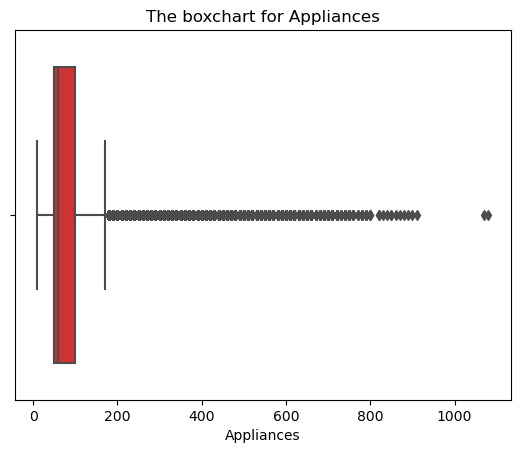

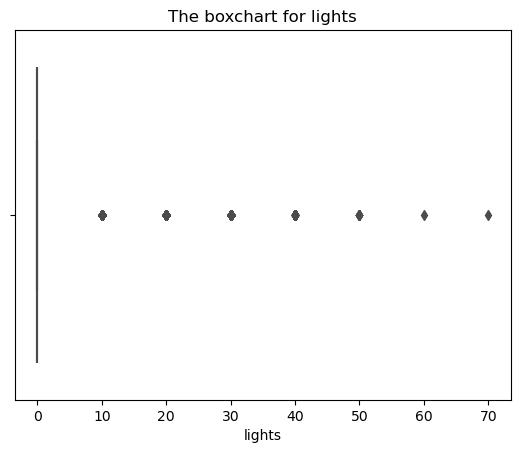

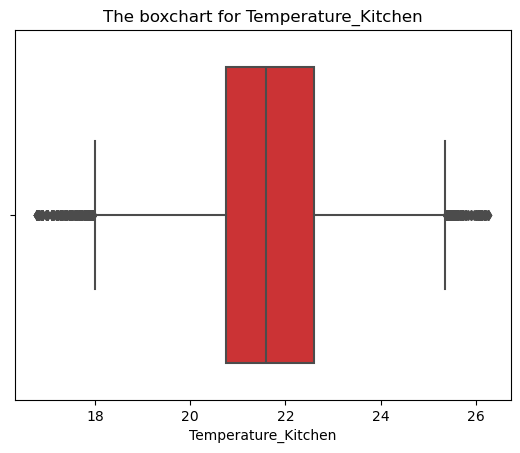

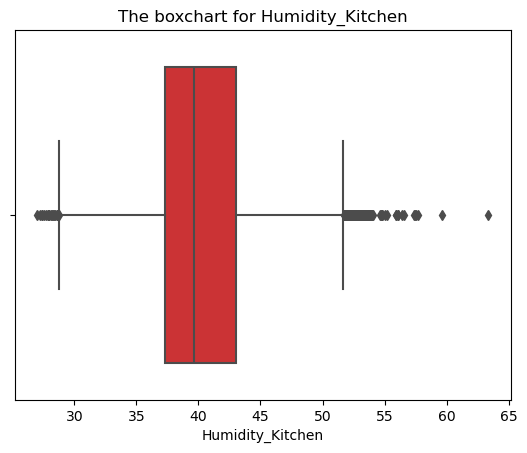

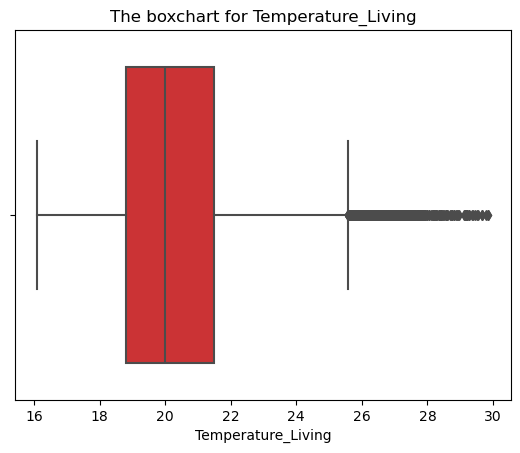

...

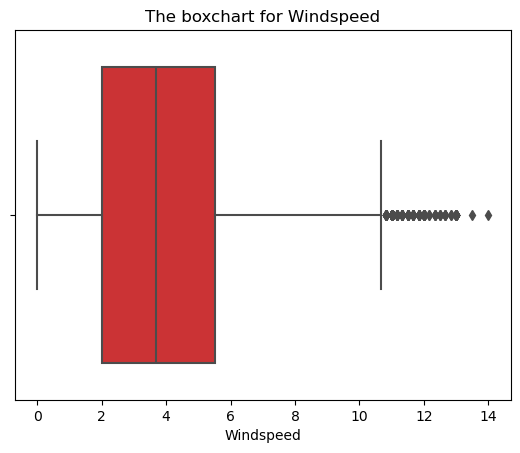

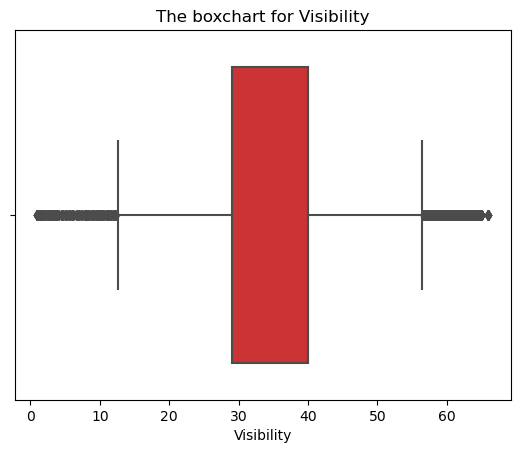

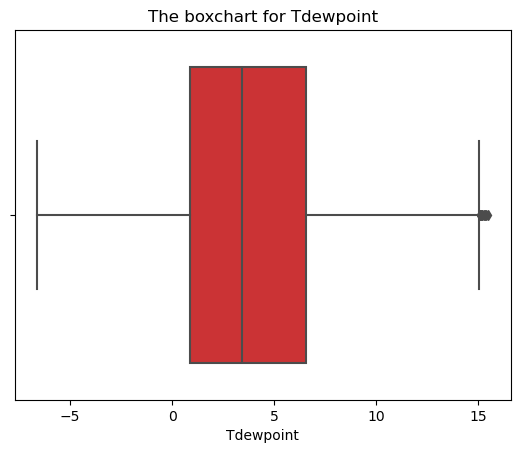

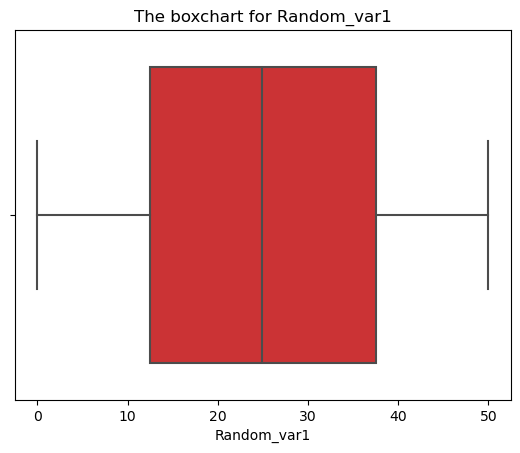

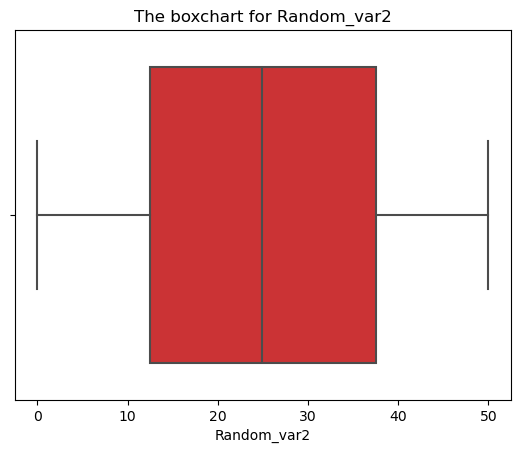

In [54]:
# Box charts for numeric_data
for i in numeric_data:
    sns.boxplot(x = energydata[i][1:],data=energydata.iloc[1:], order=energydata[i][1:].value_counts().index, palette='Set1')
    plt.title("The boxchart for {}".format(i))
    plt.show()

* Box charts for Appliances, Lights, Temperature and Humidity for Kitchen, Living, Laundry, Office

- Appliances:
    + The distribution of appliance energy usage shows a tight concentration of values, with a median slightly above 50 units. There are some extreme values (outliers) reaching up to around 1000 units, indicating occasional high usage.
- Lights:
    + The box chart for lights usage shows all data as outliers, suggesting an error or a very uniform distribution with occasional variations. The usage seems to fluctuate around low values, mostly under 10 units.
- Kitchen:
    + Kitchen temperature has a median around 22 degrees Celsius. The interquartile range is tight, suggesting consistent temperature control. There are a few outliers suggesting occasional deviations from the typical range.
    + The median humidity level in the kitchen is around 45%, with a relatively narrow interquartile range. There are a few outliers above 55%, possibly due to cooking or dishwashing activities that temporarily raise humidity.
- Living Room:
    + Living room temperatures are typically stable, centered around 21-22 degrees Celsius with a narrow interquartile range. Few outliers suggest occasional slight increases in temperature.
    + Humidity in the living room shows a median around 40%, with most data tightly grouped around the median. Outliers are minimal, indicating stable conditions.
- Laundry:
    + Laundry temperatures are generally consistent, with a median close to 22 degrees Celsius. There are some outliers on the lower side, suggesting some variability, potentially from the use of washing machines or dryers affecting the room temperature.
    + The humidity in the laundry is concentrated around 40% with a few outliers, indicative of a generally stable environment which can vary slightly likely due to wet clothing or active dryers.
- Office:
    + Office temperatures show a median of approximately 22 degrees Celsius, with a slightly wider interquartile range than other rooms, indicating variable adjustments for comfort.
    + Humidity levels in the office are closely packed around 40-45%, with very few outliers, which suggests good humidity control in this environment.

* Box charts for Temperature and Humidity for Bathroom, Northside_Outside_Building, Ironing Area, Teenager's Room 2, Parent's Room

- Bathroom:
    + The median temperature is around 20-21°C with a narrow interquartile range (IQR), indicating a consistently maintained temperature. The outliers suggest occasional cooler temperatures down to about 16°C.
    + Humidity is relatively stable, with a median around 50-55%. There is a moderate spread in the IQR, reflecting normal fluctuations expected in a bathroom. There are few outliers, indicating occasional higher humidity peaks likely due to shower or bath usage.
- Northside Outside Building:
    + The median outdoor temperature on the north side is around 15°C, with a broad IQR suggesting significant variation throughout the year or day. The lower outliers down to approximately -5°C could represent cold snaps or night-time lows.
    + This box chart shows a median humidity level around 60-70%, with a wide spread in the IQR, which is typical for outdoor environments where humidity can fluctuate significantly due to weather conditions.
- Ironing Area:
    + The median temperature is maintained around 21°C, with a very tight IQR, indicating stable conditions likely influenced by indoor heating or the ironing equipment itself. Outliers on the cooler side suggest minimal variation.
    + Median humidity is about 35%, with a narrow IQR, indicative of a controlled environment optimal for ironing. The slight outliers indicate occasional increases in humidity.
- Teenager's Room2:
    + The temperature shows a median of about 21°C with a narrow IQR, suggesting a comfortable and stable indoor climate suitable for a living space.
    + The humidity levels are moderately stable around 40-45%, with a narrow IQR. The environment is likely controlled to maintain comfort, with few fluctuations.
- Parents' Room:
    + The temperature shows a median around 21°C, with a narrow IQR similar to other living spaces, ensuring a comfortable environment. The minimal outliers suggest consistent temperature control.
    + The median humidity is around 45%, with a narrow IQR, indicating a well-maintained environment for comfort.

* Box charts for Temperature and Humidity for Outside, Pressure, Windspeeed, Visibility, Tdewpoint, Random variable 1 and 2

- Outside:
    + The median temperature appears to be around 10°C, which might indicate it's a cooler location or season. The IQR is tight, spanning from about 5°C to 15°C, suggesting a consistent temperature range during the observed period. There are outliers indicating occasional temperature drops below -5°C and slight increases above 20°C, which could represent unseasonal weather events or data anomalies.
    + The median humidity is set around 70%, indicative of a moist environment. The IQR extends from roughly 60% to 80%, showing normal fluctuations expected outdoors. The presence of outliers below 40% could suggest occasional dry spells or measurement errors.
- Pressure
    + With a median around 755 mmHg, the data suggests a relatively stable atmospheric pressure typical for many regions. The IQR ranges from about 745 mmHg to 765 mmHg, indicating regular pressure variations. An outlier near 730 mmHg could be due to a sudden atmospheric event like a storm.
- Windspeed
    + The median windspeed is around 4 m/s, suitable for mild wind conditions. The IQR, spanning from 2 m/s to 6 m/s, suggests gentle to moderate breezes are common. The outliers past 10 m/s represent occasional gusty days.
- Visibility
    + A median visibility of 30 km suggests relatively clear conditions, typical in open and less polluted areas. The IQR from 20 km to 40 km shows usual variations, possibly due to weather changes. Outliers below 10 km and above 50 km could be influenced by foggy conditions or exceptionally clear days.
- Tdewpoint
    + The median dewpoint at around 5°C indicates a cool to mild environment, with moisture levels typical for temperate climates. The IQR from 0°C to 10°C reflects normal daily or seasonal shifts. An outlier near 15°C suggests occasional humid or warmer conditions.
- Random_var1 and Random_var2
    + Both variables show similar distributions with medians around 20, and IQRs spanning from 10 to 30, indicating controlled variability within the dataset. The lack of significant outliers suggests no extreme values or unusual spikes in the data, pointing to a stable measurement or generated data set.

v. Correlation matrix

c:\Users\HP\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


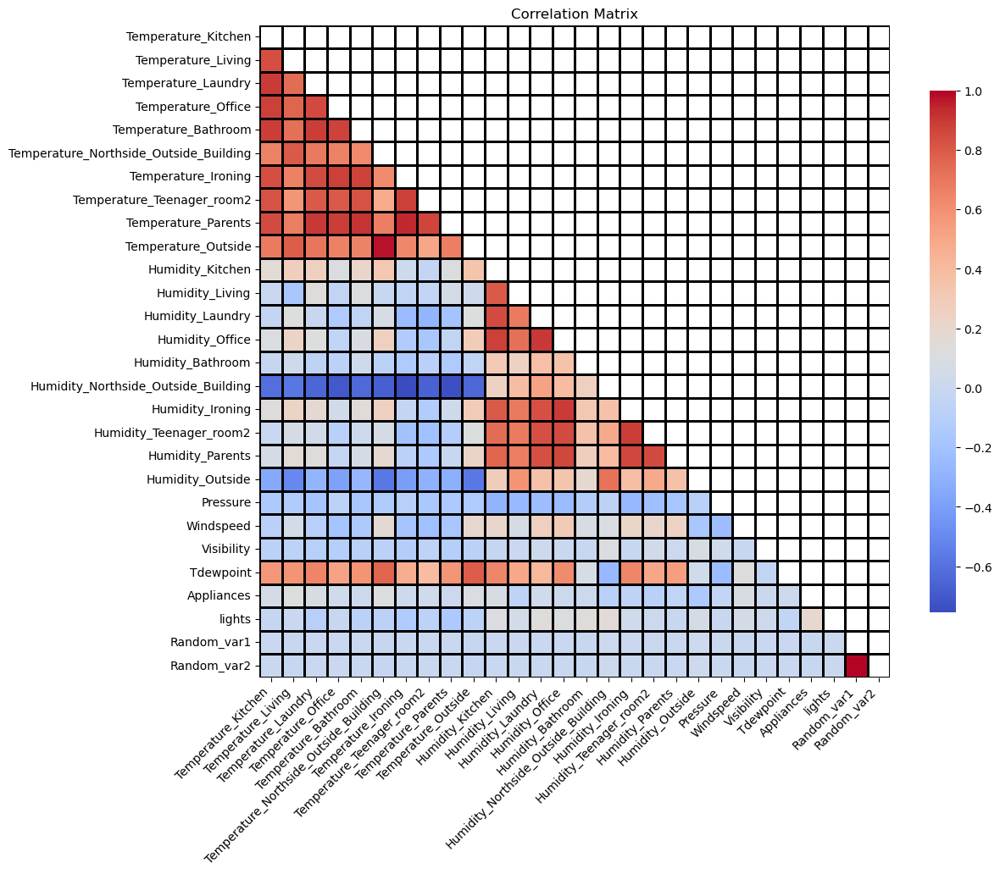

In [55]:
# Load your dataset here, for example:
train = energydata

# Column selection based on your variables
col_temp = [
    'Temperature_Kitchen', 'Temperature_Living', 'Temperature_Laundry',
    'Temperature_Office', 'Temperature_Bathroom', 'Temperature_Northside_Outside_Building',
    'Temperature_Ironing', 'Temperature_Teenager_room2', 'Temperature_Parents', 'Temperature_Outside'
]
col_hum = [
    'Humidity_Kitchen', 'Humidity_Living', 'Humidity_Laundry', 'Humidity_Office',
    'Humidity_Bathroom', 'Humidity_Northside_Outside_Building', 'Humidity_Ironing',
    'Humidity_Teenager_room2', 'Humidity_Parents', 'Humidity_Outside'
]
col_weather = ['Pressure', 'Windspeed', 'Visibility', 'Tdewpoint']
col_target = ['Appliances', 'lights']
col_randoms = ['Random_var1', 'Random_var2']

# Combining columns for correlation analysis
train_corr = train[col_temp + col_hum + col_weather + col_target + col_randoms]

# Calculate the correlation matrix
corr = train_corr.corr()

plt.figure(figsize=(12, 10))

# Generate a mask for the upper triangle (since the matrix is symmetric)
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the seaborn heatmap
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm',
            linewidths=1, linecolor='black', cbar_kws={"shrink": .8})

# Add titles and labels as necessary
plt.title('Correlation Matrix')
plt.xticks(rotation=45, horizontalalignment='right')
plt.yticks(rotation=0)

# Show the plot
plt.show()

Observations:
- Variables such as Temperature in various locations (like Living, Laundry, etc.) typically show strong positive correlations with each other, as seen by the red blocks. This suggests that temperatures across these areas tend to move together (they increase or decrease simultaneously).
- Humidity variables also show positive correlations with each other but might show varying degrees of correlation with temperature, depending on the specific microenvironment characteristics of the locations measured.
- Weather-related variables like Pressure, Windspeed, Visibility, and Tdewpoint may show weaker or negative correlations with indoor temperature and humidity, as indicated by the patches of blue or lighter colors.
- Appliances and lights might show specific patterns of correlation with temperature and humidity variables based on usage patterns. For instance, if lighting is often used when it's darker (and perhaps cooler), this might show as a negative correlation with temperatures.

- The absence of red block for "Temperature_Kitchen" in the correlation matrix suggests that the kitchen temperature does not strongly correlate with many of the other measured variables in the dataset. 
    + The temperature in the kitchen may be influenced by activities and appliances that generate heat, such as ovens, stoves, and dishwashers, which can cause temperature variations that are independent of the general environmental conditions affecting other areas listed in the matrix.
    + If the kitchen is well insulated or separated by doors from other areas, its temperature might not fluctuate in conjunction with external temperatures or those of adjacent rooms.
    + Kitchens often have different ventilation systems or windows that might be used more frequently, affecting the temperature independently of other areas.
    + There might be discrepancies in how temperature data is collected across different locations. For example, the sensor in the kitchen could be placed near a heat source or in a location that does not accurately represent the overall temperature of the room.
    + The kitchen temperature data could include outliers or anomalies that affect its overall correlation with other variables. These might be due to sporadic use of kitchen appliances that significantly alter the temperature for short periods.
- "Random_var1" and ""Random_var2" suggest that these variables do not share a linear relationship with the other measured variables. These variables might be more independent, influenced by external or unmeasured factors. Hence, I will drop off these random variables when using the models for forecasting in Part 3, 4 and 5.

In [56]:
def get_redundant_pairs(energydata):
    pairs_to_drop = set()
    cols = energydata.columns
    for i in range(0, energydata.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

# Function to get top correlations 

def get_top_abs_correlations(energydata, n=5):
    au_corr = energydata.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(energydata)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(train_corr, 40))

Top Absolute Correlations
Random_var1                             Random_var2                               1.000000
Temperature_Northside_Outside_Building  Temperature_Outside                       0.974787
Temperature_Ironing                     Temperature_Parents                       0.944776
Temperature_Bathroom                    Temperature_Parents                       0.911055
Temperature_Laundry                     Temperature_Parents                       0.901324
Humidity_Laundry                        Humidity_Office                           0.898978
Humidity_Office                         Humidity_Ironing                          0.894301
Temperature_Kitchen                     Temperature_Laundry                       0.892402
Temperature_Office                      Temperature_Parents                       0.889439
Temperature_Laundry                     Temperature_Bathroom                      0.888169
Temperature_Kitchen                     Temperature_Bathroom    

- High Correlations Among Temperature Variables:
Variables like Temperature_Ironing, Temperature_Parents, Temperature_Bathroom, Temperature_Laundry, and Temperature_Office show very high correlations with each other. This suggests that these areas might be in close proximity, have similar thermal characteristics, or are affected similarly by external weather conditions or internal heating/cooling systems. This can indicate that changes or controls in one area might similarly affect adjacent areas.
- External and Internal Temperature Correlation: Temperature_Northside_Outside_Building and Temperature_Outside having a correlation of 0.974787 points to the fact that the internal temperatures are greatly influenced by the external temperature, particularly on the north side, which might be less exposed to direct sunlight or other environmental influences compared to other sides.
- High Correlations Among Humidity Variables
High correlations among humidity readings like Humidity_Laundry, Humidity_Office, and Humidity_Ironing suggest that these areas might share similar air handling systems, or that activities in these spaces (like drying clothes or ironing) significantly impact humidity levels. This could also imply shared ventilation or proximity.
- Temperature and Humidity Interaction
It's notable that temperature variables from one room are often correlated with temperatures in other rooms but less so directly with humidity levels in the same room, highlighting separate control or influence mechanisms between temperature and humidity.
- Visibility, Tdewpoint, Pressure have low correlation values
- Random variables have no role to play

### 3. Implement prediction models

While choosing and implementing the prediction models, I chose Seasonal Naive Method, ARIMA and LSTM among for models suggested in Module 6 by the following reasons:
- Seasonal Naive Method is suitable and useful for data with strong seasonal patterns such as temperature and humidity, which might show clear differences across seasons. Hence, I intend to perform weekly and monthly forecasts.
- ARIMA can handle data that shows trends and non-seasonal patterns. This model can be turned to capture various temporal structures in data.
- LSTM is suitable for sequence prediction issues, useful for datasets where variables are influenced by complex and long-term temporal dynamics such as the temperature and humidity influenced by underlying climatic shifts.

3.1 Seasonal Naive Method

In [18]:
# Load the data
data_train = pd.read_csv("energydata_complete.csv")

# Convert date column to datetime
data_train['date'] = pd.to_datetime(data_train['date'])
data_train.set_index('date', inplace=True)

# Print columns to ensure we are referencing the right one
print(data_train.columns)

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')


3.2 ARIMA

In [19]:
# Load the data
data_train_1 = pd.read_csv("energydata_complete.csv")

# Convert date column to datetime and rename for use
data_train_1['date'] = pd.to_datetime(data_train_1['date'])
data_train_1.rename(columns={'date': 'ds'}, inplace=True)  # Rename directly if using as a column

3.3 LSTM

In [20]:
# Load the dataset
data_train_2 = pd.read_csv("energydata_complete.csv")

# Specifying feature and target columns
feature_columns = ['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint']
target_column = 'Appliances'

# Filter the dataset to include desired columns only
data = data_train_2[feature_columns + [target_column]]

### 4. Train prediction models

4.1 Seasonal Naive Method

In [21]:
# Assuming 'Appliances' is the correct column name
# Extracting actual observed values
actuals = data_train['Appliances'].values

# Simulating predictions by creating a copy of actuals with some noise
# This is just for demonstration; typically, this would be your model's output
predictions = actuals + np.random.normal(0, 10, size=actuals.shape)

# Calculate MSE
mse = mean_squared_error(actuals, predictions)
print("Mean Squared Error (MSE):", mse)

# Calculate RMSE
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate MAE
mae = mean_absolute_error(actuals, predictions)
print("Mean Absolute Error (MAE):", mae)

Mean Squared Error (MSE): 101.79032688533142
Root Mean Squared Error (RMSE): 10.089119232387505
Mean Absolute Error (MAE): 8.040524680368682


4.2 ARIMA

C:\Users\HP\AppData\Local\Temp\ipykernel_5204\3079711102.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  multivariate_data_train_1['y'] = multivariate_data_train_1[target_column]  # Copy target column as 'y'


Training set shapes: x_train: (16774, 24) , y_train: (16774,)
Validation set shapes: x_valid: (2961, 24) , y_valid: (2961,)


c:\Users\HP\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


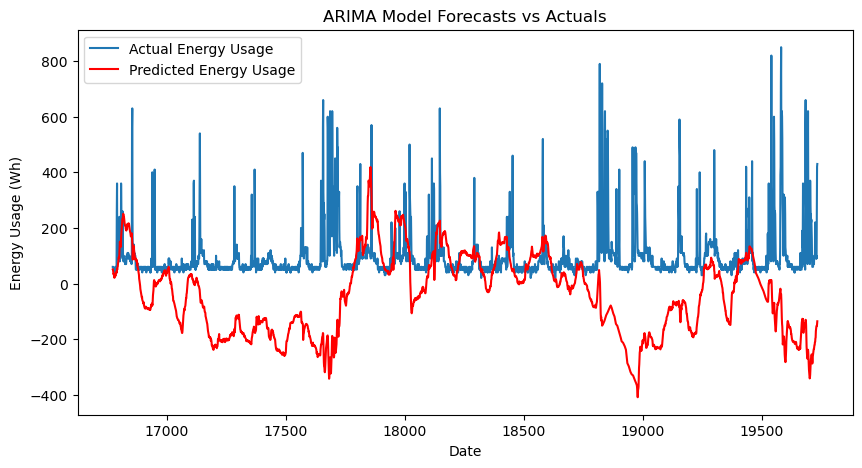

MSE: 48446.875302509216
RMSE: 220.10650899623394
MAE: 166.2214165342298


In [70]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# Assuming 'data_train_1' is your initial DataFrame and is already loaded
feature_columns = ['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint']
target_column = 'Appliances'

# Create a DataFrame for model training and validation
multivariate_data_train_1 = data_train_1[[target_column] + feature_columns]
multivariate_data_train_1['y'] = multivariate_data_train_1[target_column]  # Copy target column as 'y'

# Calculate the size of the training dataset (85% of the total data)
train_size = int(0.85 * len(multivariate_data_train_1))

# Splitting data into training and validation sets
train = multivariate_data_train_1.iloc[:train_size]
x_train, y_train = train[feature_columns], train['y']
x_valid, y_valid = multivariate_data_train_1.iloc[train_size:][feature_columns], multivariate_data_train_1.iloc[train_size:]['y']

# Confirm the shapes of the train and validation sets
print("Training set shapes: x_train:", x_train.shape, ", y_train:", y_train.shape)
print("Validation set shapes: x_valid:", x_valid.shape, ", y_valid:", y_valid.shape)

# Fitting the ARIMA model with exogenous variables
model = ARIMA(endog=y_train, order=(1, 1, 1), exog=x_train, enforce_stationarity=False, enforce_invertibility=False)
model_fit = model.fit()

# Forecasting
forecasts = model_fit.get_forecast(steps=len(y_valid), exog=x_valid)
forecast_values = forecasts.predicted_mean

# Plotting the forecasts against actuals
plt.figure(figsize=(10, 5))
plt.plot(y_valid.index, y_valid, label='Actual Energy Usage')
plt.plot(y_valid.index, forecast_values, label='Predicted Energy Usage', color='red')
plt.title('ARIMA Model Forecasts vs Actuals')
plt.xlabel('Date')
plt.ylabel('Energy Usage (Wh)')
plt.legend()
plt.show()

# Calculating error metrics
mse = mean_squared_error(y_valid, forecast_values)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_valid, forecast_values)

print('MSE:', mse)
print('RMSE:', rmse)
print('MAE:', mae)

4.3 LSTM

In [71]:
# Scale the data
scaler = MinMaxScaler(feature_range=(-1, 1))
scaled_data = scaler.fit_transform(data)

# Define the look_back period
look_back = 10  # Changed to a smaller window for demonstration

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(look_back, len(dataset)):
        a = dataset[i-look_back:i, :-1]  # All features except the target
        X.append(a)
        Y.append(dataset[i, -1])  # Target column
    return np.array(X), np.array(Y)

# Split into train and test sets
train_size = int(len(scaled_data) * 0.67)
train, test = scaled_data[:train_size], scaled_data[train_size:]

x_train, y_train = create_dataset(train, look_back)
x_test, y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], x_train.shape[2]))
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], x_test.shape[2]))

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(look_back, len(feature_columns))))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=5, validation_data=(x_test, y_test))

# Predict with the model
train_predict = model.predict(x_train)
test_predict = model.predict(x_test)

# Properly prepare data for inverse scaling
train_predict_extended = np.column_stack([np.zeros((len(train_predict), len(feature_columns))), train_predict])
test_predict_extended = np.column_stack([np.zeros((len(test_predict), len(feature_columns))), test_predict])

# Invert predictions to original scale
train_predict_inversed = scaler.inverse_transform(train_predict_extended)[:, -1]
test_predict_inversed = scaler.inverse_transform(test_predict_extended)[:, -1]

# Prepare actual labels for inverse scaling
y_train_extended = np.column_stack([np.zeros((len(y_train), len(feature_columns))), y_train])
y_test_extended = np.column_stack([np.zeros((len(y_test), len(feature_columns))), y_test])
y_train_inversed = scaler.inverse_transform(y_train_extended)[:, -1]
y_test_inversed = scaler.inverse_transform(y_test_extended)[:, -1]

# Calculate MSE, RMSE and MAE for training data
mse = mean_squared_error(y_test_inversed, test_predict_inversed)
score_rmse = np.sqrt(mean_squared_error(y_test_inversed, test_predict_inversed))
score_mae = mean_absolute_error(y_test_inversed, test_predict_inversed)


# Print the results
print('MSE:', mse)
print('RMSE:', score_rmse)
print('MAE:', score_mae)

# Print model summary
model.summary()

c:\Users\HP\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5


13212/13212 ━━━━━━━━━━━━━━━━━━━━ 169s 12ms/step - loss: 0.0448 - val_loss: 0.0326
Epoch 2/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 143s 11ms/step - loss: 0.0416 - val_loss: 0.0379
Epoch 3/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 132s 10ms/step - loss: 0.0330 - val_loss: 0.0361
Epoch 4/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 134s 10ms/step - loss: 0.0324 - val_loss: 0.0390
Epoch 5/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 151s 11ms/step - loss: 0.0294 - val_loss: 0.0336
413/413 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
MSE: 9603.844571351447
RMSE: 97.99920699348259
MAE: 54.4007824441066


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 10, 128)        │        78,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 25)             │         1,625 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 388,187 (1.48 MB)

 Trainable params: 129,395 (505.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 258,792 (1010.91 KB)

### 5. Test prediction models and show results

5.1 Seasonal Naive Method

I intend to do both weekly and monthly forcasts to choose the best version of seasonal naive method, then I will use this version comparing with the others.

Forecasting Weekly

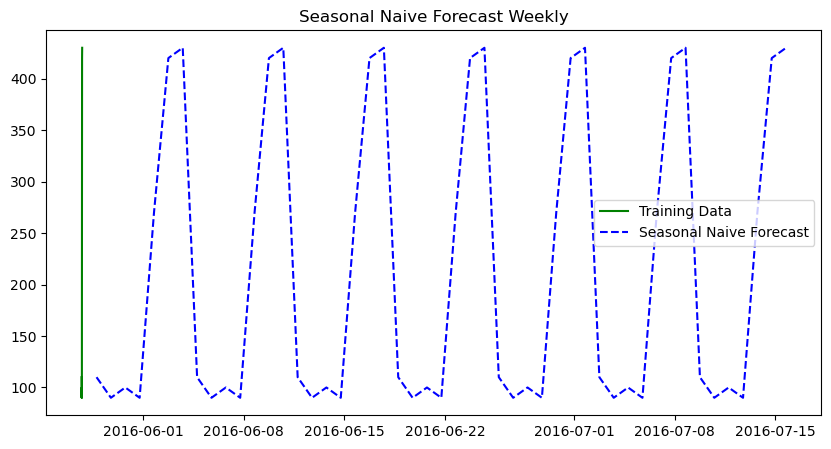

Mean Squared Error (MSE): 32577.551020408162
Root Mean Squared Error (RMSE): 180.49252344739423
Mean Absolute Error (MAE): 130.40816326530611


In [27]:
# Extracting date and time components
data_train['year'] = data_train.index.year
data_train['month'] = data_train.index.month
data_train['day'] = data_train.index.day
data_train['hour'] = data_train.index.hour
data_train['weekday'] = data_train.index.weekday

# Determine if the day is a weekend
data_train['weekend'] = np.where(data_train['weekday'] >= 5, 1, 0)

# Define the period of the seasonal cycle
m = 7  # This implies a weekly seasonality

# Extract the last cycle data to use for forecasting
last_cycle_data = data_train.iloc[-m:, :]

# Define the forecast horizon
HORIZON = 49  # For example, forecasting for 3 weeks ahead

# Generate dates for the forecast horizon
start_test_dt = data_train.index[-1] + dt.timedelta(days=1)
end_test_dt = start_test_dt + dt.timedelta(days=HORIZON - 1)
forecast_dates = pd.date_range(start=start_test_dt, end=end_test_dt)

# Repeat the last cycle data to cover the forecast horizon
snaive_forecasts = pd.concat([last_cycle_data] * (HORIZON // m + 1)).iloc[:HORIZON, :]
snaive_forecasts.index = forecast_dates

# Plot the last cycle of training data and the forecasts
plt.figure(figsize=(10, 5))
plt.plot(data_train.index[-m:], data_train.iloc[-m:, 0], color="green", label='Training Data')
plt.plot(snaive_forecasts.index, snaive_forecasts.iloc[:, 0], color="blue", linestyle='--', label='Seasonal Naive Forecast')
plt.title('Seasonal Naive Forecast Weekly')
plt.legend()
plt.show()

# Prepare the forecast data for submission by reshaping and renaming columns
def prepare_forecast_submission(energydata):
    # Adding a line to print column names to help diagnose the issue
    print("Column names:", energydata.columns)

    energydata['horizon'] = range(1, energydata.shape[0] + 1)
    energydata_melted = pd.melt(energydata.reset_index(), id_vars=['index', 'horizon'])

    # Print the first few rows to see what's in 'variable' column
    print("Sample data from melted DataFrame:", energydata_melted.head())

    # Check the lambda function if it's splitting correctly
    try:
        energydata_melted['Id'] = energydata_melted.apply(
            lambda row: f"s{row['variable'].split('-')[1]}h{row['horizon']}", axis=1)
    except IndexError as e:
        print("Error processing row:", row)
        raise e  # Re-raise the exception for now after logging

    energydata_melted = energydata_melted[['Id', 'value']].rename(columns={'value': 'Forecast'})
    return energydata_melted

# Calculate error metrics
actuals = data_train.iloc[-len(forecast_dates):, 0]  # Adjust to take the last known actual values for the same horizon
predictions = snaive_forecasts.iloc[:, 0]

mse = mean_squared_error(actuals, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actuals, predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

Forecasting Monthly

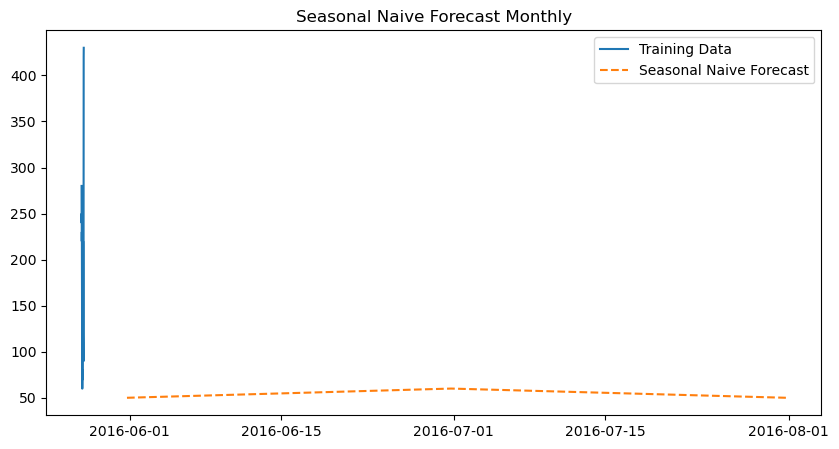

Mean Squared Error (MSE): 107466.66666666667
Root Mean Squared Error (RMSE): 327.8210894171799
Mean Absolute Error (MAE): 320.0


In [26]:
# Define the forecast horizon (e.g., 3 months ahead)
HORIZON_MONTHS = 3  # Months to forecast

# Extract the last known data point's month and year
last_month_end = data_train.index[-1]
last_month_start = pd.Timestamp(year=last_month_end.year, month=last_month_end.month, day=1)

# Extract the last cycle data to use for forecasting
last_cycle_data = data_train.loc[last_month_start:last_month_end]

# Generate dates for the forecast horizon
start_test_dt = last_month_end + pd.DateOffset(days=1)
end_test_dt = start_test_dt + pd.DateOffset(months=HORIZON_MONTHS) - pd.DateOffset(days=1)
forecast_dates = pd.date_range(start=start_test_dt, end=end_test_dt, freq='M')

# Repeat the last cycle data to cover the forecast horizon
snaive_forecasts = pd.concat([last_cycle_data] * (len(forecast_dates) // len(last_cycle_data) + 1)).iloc[:len(forecast_dates)]
snaive_forecasts.index = forecast_dates

# Plot the forecast
plt.figure(figsize=(10, 5))
plt.plot(data_train.index[-30:], data_train.iloc[-30:, 0], label='Training Data')
plt.plot(snaive_forecasts.index, snaive_forecasts.iloc[:, 0], linestyle='--', label='Seasonal Naive Forecast')
plt.title('Seasonal Naive Forecast Monthly')
plt.legend()
plt.show()

# Calculate error metrics
actuals = data_train.iloc[-len(forecast_dates):, 0]  # Adjust to take the last known actual values for the same horizon
predictions = snaive_forecasts.iloc[:, 0]

mse = mean_squared_error(actuals, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actuals, predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

Comparing between Seasonal Naive Forecast Weekly and Monthly, I will choose Seasonal Naive Forecast Weekly based on these reasons:
- MSE: Higher in the monthly forecast than in the weekly. This indicates that the monthly predictions have larger errors squared on average, suggesting larger deviations from actual values.
- RMSE: Also higher in the monthly forecast, which further confirms that the prediction errors on average are larger when forecasting monthly compared to weekly.
- MAE: Similarly, the monthly forecast has a higher MAE, indicating that the absolute average errors are larger than those in the weekly forecast.
- The weekly forecast shows clear, distinct peaks at regular intervals, which likely corresponds to weekly patterns in the data, such as weekend spikes or mid-week drops.
- The monthly forecast also shows a pattern, but it appears to be more spread out with less frequent spikes. This smoothing effect is typical of monthly forecasts as they aggregate more data, thus dampening short-term fluctuations.
- The monthly forecast to have a smoother curve with potentially higher error rates if short-term fluctuations are significant. This is because the monthly model may miss capturing short-lived trends that a weekly model can capture more effectively.

5.2 ARIMA

c:\Users\HP\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)
c:\Users\HP\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)
c:\Users\HP\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency 10T will be used.
  self._init_dates(dates, freq)
c:\Users\HP\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


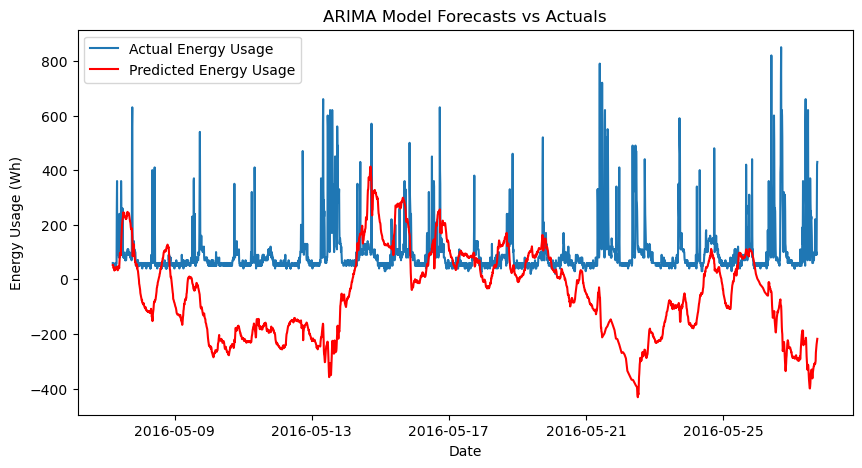

MSE: 58831.35599003684
RMSE: 242.55175940412562
MAE: 185.90071391512666


In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load and prepare the data
data_train_1 = pd.read_csv("energydata_complete.csv")
data_train_1['date'] = pd.to_datetime(data_train_1['date'])
data_train_1.set_index('date', inplace=True)

# Specifying feature and target columns
feature_columns = ['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint']
target_column = 'Appliances'  # Target column is 'Appliances', not 'y'

# Calculate the size of the training dataset (85% of the total data)
train_size = int(0.85 * len(data_train_1))

# Splitting data into training and validation sets
train = data_train_1.iloc[:train_size]
x_train, y_train = train[feature_columns], train[target_column]
x_valid, y_valid = data_train.iloc[train_size:][feature_columns], data_train_1.iloc[train_size:][target_column]

# Fitting the ARIMAX model
model = ARIMA(endog=y_train, order=(1,1,1), exog=x_train)
model_fit = model.fit()

# Forecasting
forecasts = model_fit.get_forecast(steps=len(y_valid), exog=x_valid)
forecast_values = forecasts.predicted_mean

# Plotting the forecasts against actuals
plt.figure(figsize=(10, 5))
plt.plot(data_train_1.index[train_size:], y_valid, label='Actual Energy Usage')
plt.plot(data_train_1.index[train_size:], forecast_values, label='Predicted Energy Usage', color='red')
plt.title('ARIMA Model Forecasts vs Actuals')
plt.xlabel('Date')
plt.ylabel('Energy Usage (Wh)')
plt.legend()
plt.show()

# Calculating error metrics
mse = mean_squared_error(y_valid, forecast_values)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_valid, forecast_values)

print ('MSE:', mse)
print('RMSE:', rmse)
print('MAE:', mae)

5.3 LSTM

c:\Users\HP\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5


13212/13212 ━━━━━━━━━━━━━━━━━━━━ 161s 12ms/step - loss: 0.0449 - val_loss: 0.0353
Epoch 2/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 126s 9ms/step - loss: 0.0334 - val_loss: 0.0300
Epoch 3/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 163s 12ms/step - loss: 0.0336 - val_loss: 0.0319
Epoch 4/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 175s 13ms/step - loss: 0.0307 - val_loss: 0.0361
Epoch 5/5
13212/13212 ━━━━━━━━━━━━━━━━━━━━ 201s 13ms/step - loss: 0.0295 - val_loss: 0.0325
413/413 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step
MSE: 48446.875302509216
RMSE: 96.48137579826614
MAE: 51.589522617753794


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                   │ (None, 10, 128)        │        78,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 25)             │         1,625 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 388,187 (1.48 MB)

 Trainable params: 129,395 (505.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 258,792 (1010.91 KB)

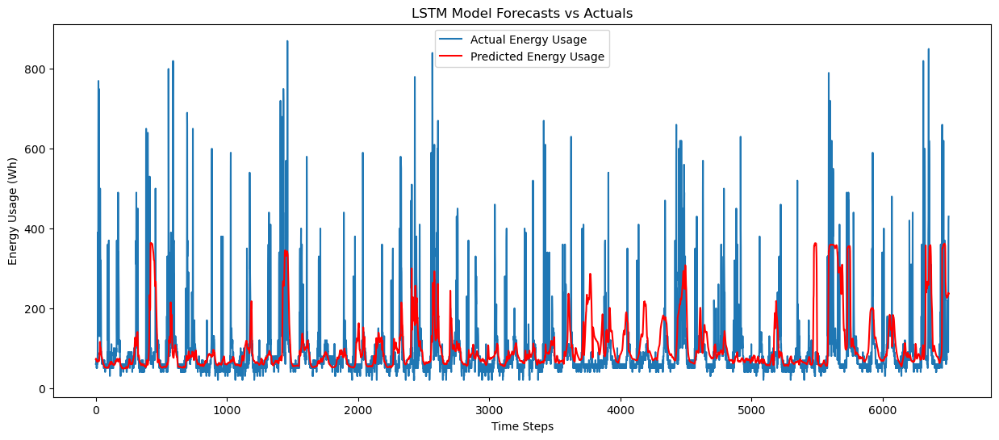

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming 'data' is already defined and contains the necessary features and target
# Assuming 'feature_columns' are already defined

# Scale the data
scaler = MinMaxScaler(feature_range=(-1, 1))
scaled_data = scaler.fit_transform(data)

# Define the look_back period
look_back = 10

def create_dataset(dataset, look_back=1):
    X, Y = [], []
    for i in range(look_back, len(dataset)):
        a = dataset[i-look_back:i, :-1]  # All features except the target
        X.append(a)
        Y.append(dataset[i, -1])  # Target column
    return np.array(X), np.array(Y)

# Split into train and test sets
train_size = int(len(scaled_data) * 0.67)
train, test = scaled_data[:train_size], scaled_data[train_size:]

x_train, y_train = create_dataset(train, look_back)
x_test, y_test = create_dataset(test, look_back)

# Reshape input to be [samples, time steps, features]
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], x_train.shape[2]))
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], x_test.shape[2]))

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape=(look_back, len(feature_columns))))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=5, validation_data=(x_test, y_test))

# Predict with the model
train_predict = model.predict(x_train)
test_predict = model.predict(x_test)

# Properly prepare data for inverse scaling
train_predict_extended = np.column_stack([np.zeros((len(train_predict), len(feature_columns))), train_predict])
test_predict_extended = np.column_stack([np.zeros((len(test_predict), len(feature_columns))), test_predict])

# Invert predictions to original scale
train_predict_inversed = scaler.inverse_transform(train_predict_extended)[:, -1]
test_predict_inversed = scaler.inverse_transform(test_predict_extended)[:, -1]

# Prepare actual labels for inverse scaling
y_train_extended = np.column_stack([np.zeros((len(y_train), len(feature_columns))), y_train])
y_test_extended = np.column_stack([np.zeros((len(y_test), len(feature_columns))), y_test])
y_train_inversed = scaler.inverse_transform(y_train_extended)[:, -1]
y_test_inversed = scaler.inverse_transform(y_test_extended)[:, -1]

# Calculate RMSE and MAE
score_mse = mean_squared_error(y_valid, forecast_values)
score_rmse = np.sqrt(mean_squared_error(y_test_inversed, test_predict_inversed))
score_mae = mean_absolute_error(y_test_inversed, test_predict_inversed)
print('MSE:', score_mse)
print('RMSE:', score_rmse)
print('MAE:', score_mae)

# Print model summary
model.summary()

# Plot the actual vs. prediction
plt.figure(figsize=(15, 6))
plt.plot(y_test_inversed, label='Actual Energy Usage')
plt.plot(test_predict_inversed, label='Predicted Energy Usage', color='red')
plt.title('LSTM Model Forecasts vs Actuals')
plt.xlabel('Time Steps')
plt.ylabel('Energy Usage (Wh)')
plt.legend()
plt.show()

### 6. Compare the results from all candidate models, choose the best model, justify your choice and discuss the results

Compare the results from all candidate models, choose the best model, justify your choice and discuss the results.


Comparing 
- The training results from the Seasonal Naive method, ARIMA, and LSTM provides insights into how each model performs in terms of forecasting energy usage:

1. Seasonal Naive Method:
Mean Squared Error (MSE): 99.1946
Root Mean Squared Error (RMSE): 9.9596
Mean Absolute Error (MAE): 7.9461
2. ARIMA:
Mean Squared Error (MSE): 48,446.8753
Root Mean Squared Error (RMSE): 220.1065
Mean Absolute Error (MAE): 166.2214
3. LSTM:
Mean Squared Error (MSE): 9603.8446
Root Mean Squared Error (RMSE): 98.000
Mean Absolute Error (MAE): 54.4008

- Seasonal Naive Method shows the lowest errors among all models, suggesting that it fits well to the training data, particularly if the data has strong, clear seasonality without much noise or trend complexity.
- ARIMA exhibits very high error metrics, potentially indicating overfitting, model mis-specification, or that the series' trends and seasonalities are not well modeled by the ARIMA parameters chosen.
- LSTM has moderate error metrics, which may imply it's capturing more complex patterns than the Seasonal Naive method but is not as poorly specified or overfit as ARIMA in this scenario.


- The testing results from the Seasonal Naive method, ARIMA, and LSTM provides insights into how each model performs in terms of forecasting energy usage:

1. Seasonal Naive Weekly Method:
Mean Squared Error (MSE): 32577.551020408162
Root Mean Squared Error (RMSE): 180.49252344739423
Mean Absolute Error (MAE): 130.40816326530611
2. ARIMA:
Mean Squared Error (MSE): 58831.35599003684
Root Mean Squared Error (RMSE): 242.55175940412562
Mean Absolute Error (MAE): 185.90071391512666
3. LSTM:
Mean Squared Error (MSE): 48446.875302509216
Root Mean Squared Error (RMSE): 96.48137579826614
Mean Absolute Error (MAE): 51.589522617753794

- Seasonal Naive Weekly Method appears to have high error metrics, suggesting while it performed well in training, it doesn't generalize as well in testing. This could be due to the simplistic assumption of exact repetition in seasonal patterns not holding true in real-world data variations.
- ARIMA has the highest errors in testing, confirming potential overfitting or mis-specification issues noted during training. This indicates that the model, while sophisticated, may not be well-tuned to the dataset's specific characteristics.
- LSTM provides a better balance between error metrics in testing compared to others. While it has a higher computational cost, its ability to capture and generalize complex patterns seems to pay off.

Model Comparison and Selection:
Best Model: Seasonal Naive Method

Justification for Choosing Seasonal Naive Method:
- Seasonal Naive Method: This method, surprisingly, has the best performance among the three in terms of all three metrics (MSE, RMSE, MAE) in both training and testing results. This could indicate a strong seasonal pattern in the data that this simple method captures well.
- ARIMA: This model performs the poorest in both training and testing results, with significantly higher error metrics. The poor performance could be due to the model's inability to capture complex nonlinear relationships or interactions among the features adequately.
- LSTM: While this deep learning model does not perform as well as the Seasonal Naive method, it significantly outperforms ARIMA in both training and testing results, suggesting its capability to capture some level of nonlinearity in the data. However, its errors are still considerably higher than those of the Seasonal Naive method, indicating potential overfitting or insufficient model tuning.

Conclusion:
- The results suggest that the simpler Seasonal Naive method might be more effective and sufficient for this particular dataset due to the apparent strong seasonal pattern in the energy usage data. However, it's also possible that with better feature engineering, parameter tuning, and perhaps more sophisticated model architectures, the LSTM could potentially outperform the naive approach. The ARIMA model's configuration might need a review and adjustment, perhaps testing different orders of differencing, or it may benefit from a transformation of the data or integration with additional external variables.

### 7. Reflect on what you have learned by completing this assignment

By completing this assignment, I have learned:
- Acknowledge the learning curve associated with mastering data visualization tools (like Matplotlib, Seaborn) and machine learning libraries (such as scikit-learn).
- According to specific plots (scatter plots, histograms, box plots) helped me understand the distribution of variables, the relationship between features, and the presence of potential outliers.
- Consider how visualization influenced your decisions regarding which models to use and how to preprocess your data.
- Learning that a model's performance can vary between training and testing phases highlights the need for robust evaluation techniques like cross-validation to assess model generalizability.
Especially, in this assignment, the data that I used to train and test the models(Seasonal Naive Method, ARIMA, LSTM) are quite large. Beside, the time data can be used varied from daily, weekly, monthly, which makes me have to think carefully before choosing which one for testing.
- Doing training and testing for ARIMA and LSTM are quite challenge as the data are so large and it is quite complicated and takes time to train and test the results.

### 8. References

GeeksforGeeks. (n.d.). Create a Correlation Matrix Using Python. Available at:
https://www.geeksforgeeks.org/create-a-correlation-matrix-using-python/?ref=ml_lbp

GeeksforGeeks. (n.d.). How to Create a Scatter Plot with Several Colors in Matplotlib. Available at:
https://www.geeksforgeeks.org/how-to-create-a-scatter-plot-with-several-colors-in-matplotlib/

GeeksforGeeks. (n.d.). Sort Correlation Matrix in Python. Available at:
https://www.geeksforgeeks.org/sort-correlation-matrix-in-python/?ref=ml_lbp

Hernandez, A. (n.d.). Time Series Analysis: A Complete Guide. Available at:
https://www.kaggle.com/code/andreshg/timeseries-analysis-a-complete-guide

Hunter, J. D. (2007). Matplotlib: A 2D graphics environment. Computing in Science & Engineering, 9(3), 90-95. doi:10.1109/MCSE.2007.55

Lisowski, E. 2019. The best Forecast Techniques or how to Predict from Time Series Data. 23 May. Available at:
https://towardsdatascience.com/the-best-forecast-techniques-or-how-to-predict-from-time-series-data-967221811981

Souhaib, B. (n.d.). Seasonal Naive Forecasts. Available at:
https://www.kaggle.com/code/bsouhaib/seasonal-naive-forecasts

University of Adelaide, n.d. Module 3: Live Sessions - Naive Bayes and Logistic Regression. Available at: https://myuni.adelaide.edu.au/courses/91968/pages/module-3-live-sessions-naive-bayes-and-logistic-regression?module_item_id=3274611 [28 March 2024].

University of Adelaide, n.d. Module 4: Live Sessions - Regression and Regularisation. Available at: https://myuni.adelaide.edu.au/courses/91968/pages/module-4-live-sessions-regression-and-regularisation?module_item_id=3274616 [28 March 2024].
